In [97]:
import dwdatareader as dw
import matplotlib.pyplot as plt 
import noisereduce as nr
from IPython.display import Audio
from scipy import signal
from scipy.fft import fft, fftfreq, fftshift, rfft, rfftfreq
from scipy.signal import butter,filtfilt
import numpy as np
import acoustics.signal as S
import pandas as pd
import re
import os
import librosa as l
import scipy
import PyOctaveBand
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics
import scikitplot as skplt
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import IsolationForest
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import validation_curve
from sklearn.linear_model import Ridge
from sklearn.model_selection import learning_curve
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import balanced_accuracy_score
from sklearn.model_selection import ShuffleSplit
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
from sklearn import mixture
from sklearn.svm import SVC
import more_itertools as mit
import seaborn as sns
import math
import os
import csv
from sklearn.model_selection import StratifiedShuffleSplit
from imblearn.under_sampling import RandomUnderSampler
from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree
from scipy import stats
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_regression
from scipy.fftpack import dct
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from numpy import percentile
from model import machine
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RandomizedSearchCV
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

from sklearn.metrics import f1_score
from mlxtend.evaluate import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import fbeta_score

# Read files II, III, IV and combine them 

(17327, 20) (18771, 20) (19493, 20)
Count of class cavities for tool WKZ_150600_207005


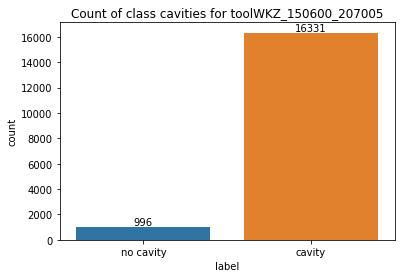

Count of class cavities for tool WKZ_150600_207006


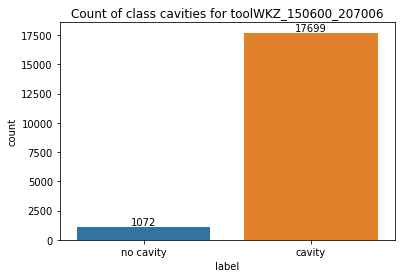

Count of class cavities for tool WKZ_150600_207011


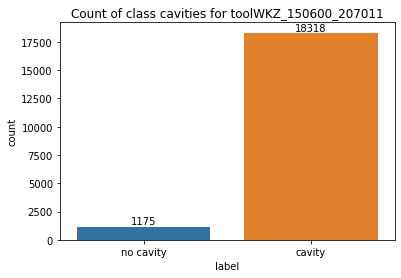

Count of class cavities for tool Combined


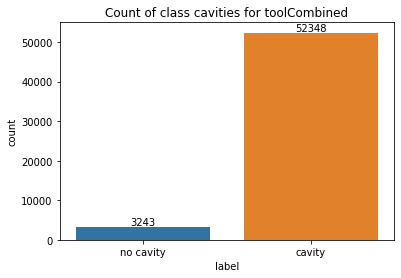

In [98]:
filepath='../Data/correct_rotation_force/Raw_data/feature/WKZ_150600_207005/Feature/Time/II.csv'
df=pd.read_csv(filepath)

data=df.iloc[:,:-1]
label=np.array(df.iloc[:,-1:]).ravel().astype(int)

norm_time=MinMaxScaler()
norm_time.fit(data)
norm_data3=norm_time.transform(data)

combined_05_II=pd.concat([pd.DataFrame(norm_data3),pd.DataFrame(label)],axis=1)
combined_05_II.columns=['Peak','energy','impulse_factor','kurtosis_factor','clearance_factor','square_root_mean','root_mean_square','kurtosis','margin_factor','crest_factor','skewness','peak_to_peak_value','shape_factor','mean','variance','distance','zero_cross','avg_rotation','avg_force','label']
# combined_05_II.head()

filepath='../Data/correct_rotation_force/Raw_data/feature/WKZ_150600_207006/Feature/Time/II.csv'
df1=pd.read_csv(filepath)

data1=df1.iloc[:,:-1]
label1=np.array(df1.iloc[:,-1:]).ravel().astype(int)

norm_time06=MinMaxScaler()
norm_time06.fit(data1)
norm_data06=norm_time06.transform(data1)

combined_06_II=pd.concat([pd.DataFrame(norm_data06),pd.DataFrame(label1)],axis=1)
combined_06_II.columns=['Peak','energy','impulse_factor','kurtosis_factor','clearance_factor','square_root_mean','root_mean_square','kurtosis','margin_factor','crest_factor','skewness','peak_to_peak_value','shape_factor','mean','variance','distance','zero_cross','avg_rotation','avg_force','label']
# combined_06_II.head()

filepath='../Data/correct_rotation_force/Raw_data/feature/WKZ_150600_207011/Feature/Time/II.csv'
df2=pd.read_csv(filepath)

data2=df2.iloc[:,:-1]
label2=np.array(df2.iloc[:,-1:]).ravel().astype(int)

norm_time11=MinMaxScaler()
norm_time11.fit(data2)
norm_data11=norm_time11.transform(data2)

combined_11_II=pd.concat([pd.DataFrame(norm_data11),pd.DataFrame(label2)],axis=1)
combined_11_II.columns=['Peak','energy','impulse_factor','kurtosis_factor','clearance_factor','square_root_mean','root_mean_square','kurtosis','margin_factor','crest_factor','skewness','peak_to_peak_value','shape_factor','mean','variance','distance','zero_cross','avg_rotation','avg_force','label']
# combined_11_II.head()

combined_II=pd.concat([combined_05_II, combined_06_II, combined_11_II])
combined_II.columns=['Peak','energy','impulse_factor','kurtosis_factor','clearance_factor','square_root_mean','root_mean_square','kurtosis','margin_factor','crest_factor','skewness','peak_to_peak_value','shape_factor','mean','variance','distance','zero_cross','avg_rotation','avg_force','label']
combined_II.head()

def count_cavity_not(data,tool_name):
    print("Count of class cavities for tool "+tool_name)
    class_names=['no cavity','cavity']
    ax = sns.countplot(x=data)
    ax.set_xticklabels(class_names)
    ax.bar_label(ax.containers[0])
    ax.set_title("Count of class cavities for tool"+tool_name)
    plt.show()

# fig,ax=plt.subplots(1,3,figsize=(20,8) )
print(combined_05_II.shape,combined_06_II.shape,combined_11_II.shape) 
count_cavity_not(combined_05_II.label,'WKZ_150600_207005')
count_cavity_not(combined_06_II.label,'WKZ_150600_207006')
count_cavity_not(combined_11_II.label,'WKZ_150600_207011')
count_cavity_not(combined_II.label,'Combined')

(6167, 20) (6681, 20) (6938, 20)
Count of class cavities for tool WKZ_150600_207005


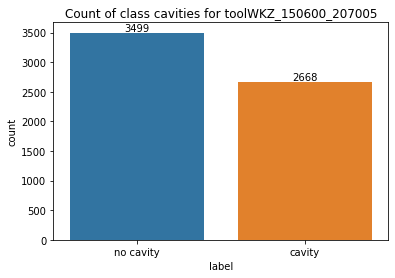

Count of class cavities for tool WKZ_150600_207006


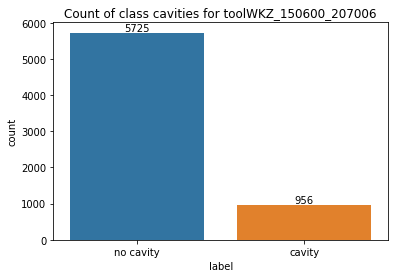

Count of class cavities for tool WKZ_150600_207011


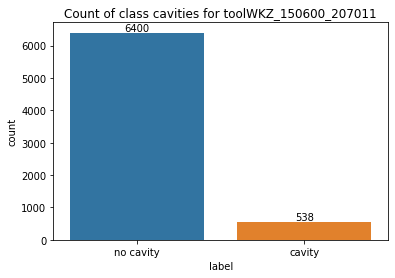

Count of class cavities for tool Combined


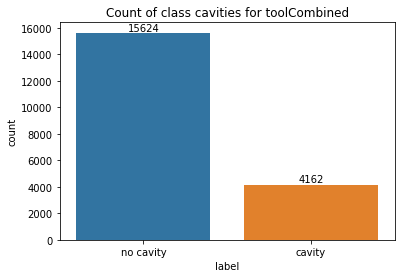

In [99]:
filepath='../Data/correct_rotation_force/Raw_data/feature/WKZ_150600_207005/Feature/Time/III.csv'
df=pd.read_csv(filepath)

data=df.iloc[:,:-1]
label=np.array(df.iloc[:,-1:]).ravel().astype(int)

norm_time=MinMaxScaler()
norm_time.fit(data)
norm_data3=norm_time.transform(data)

combined_05_III=pd.concat([pd.DataFrame(norm_data3),pd.DataFrame(label)],axis=1)
combined_05_III.columns=['Peak','energy','impulse_factor','kurtosis_factor','clearance_factor','square_root_mean','root_mean_square','kurtosis','margin_factor','crest_factor','skewness','peak_to_peak_value','shape_factor','mean','variance','distance','zero_cross','avg_rotation','avg_force','label']
# combined_05_II.head()

filepath='../Data/correct_rotation_force/Raw_data/feature/WKZ_150600_207006/Feature/Time/III.csv'
df1=pd.read_csv(filepath)

data1=df1.iloc[:,:-1]
label1=np.array(df1.iloc[:,-1:]).ravel().astype(int)

norm_time06=MinMaxScaler()
norm_time06.fit(data1)
norm_data06=norm_time06.transform(data1)

combined_06_III=pd.concat([pd.DataFrame(norm_data06),pd.DataFrame(label1)],axis=1)
combined_06_III.columns=['Peak','energy','impulse_factor','kurtosis_factor','clearance_factor','square_root_mean','root_mean_square','kurtosis','margin_factor','crest_factor','skewness','peak_to_peak_value','shape_factor','mean','variance','distance','zero_cross','avg_rotation','avg_force','label']
# combined_06_II.head()

filepath='../Data/correct_rotation_force/Raw_data/feature/WKZ_150600_207011/Feature/Time/III.csv'
df2=pd.read_csv(filepath)

data2=df2.iloc[:,:-1]
label2=np.array(df2.iloc[:,-1:]).ravel().astype(int)

norm_time11=MinMaxScaler()
norm_time11.fit(data2)
norm_data11=norm_time11.transform(data2)

combined_11_III=pd.concat([pd.DataFrame(norm_data11),pd.DataFrame(label2)],axis=1)
combined_11_III.columns=['Peak','energy','impulse_factor','kurtosis_factor','clearance_factor','square_root_mean','root_mean_square','kurtosis','margin_factor','crest_factor','skewness','peak_to_peak_value','shape_factor','mean','variance','distance','zero_cross','avg_rotation','avg_force','label']
# combined_11_II.head()

combined_III=pd.concat([combined_05_III, combined_06_III, combined_11_III])
combined_III.columns=['Peak','energy','impulse_factor','kurtosis_factor','clearance_factor','square_root_mean','root_mean_square','kurtosis','margin_factor','crest_factor','skewness','peak_to_peak_value','shape_factor','mean','variance','distance','zero_cross','avg_rotation','avg_force','label']
combined_III.head()

def count_cavity_not(data,tool_name):
    print("Count of class cavities for tool "+tool_name)
    class_names=['no cavity','cavity']
    ax = sns.countplot(x=data)
    ax.set_xticklabels(class_names)
    ax.bar_label(ax.containers[0])
    ax.set_title("Count of class cavities for tool"+tool_name)
    plt.show()

# fig,ax=plt.subplots(1,3,figsize=(20,8) )
print(combined_05_III.shape,combined_06_III.shape,combined_11_III.shape) 
count_cavity_not(combined_05_III.label,'WKZ_150600_207005')
count_cavity_not(combined_06_III.label,'WKZ_150600_207006')
count_cavity_not(combined_11_III.label,'WKZ_150600_207011')
count_cavity_not(combined_III.label,'Combined')

(17423, 20) (18875, 20) (19601, 20)
Count of class cavities for tool WKZ_150600_207005


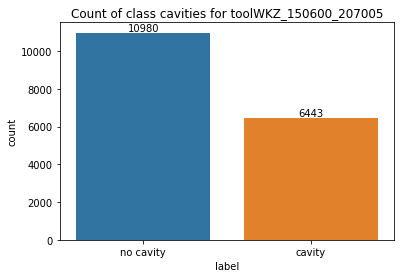

Count of class cavities for tool WKZ_150600_207006


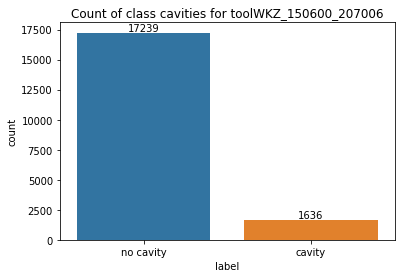

Count of class cavities for tool WKZ_150600_207011


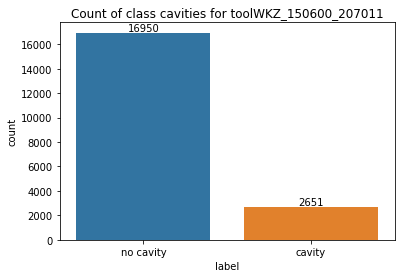

Count of class cavities for tool Combined


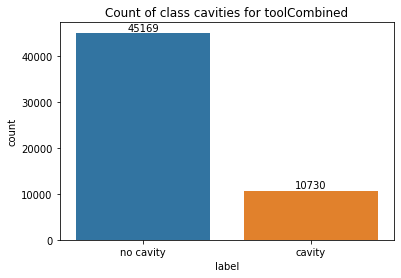

In [100]:
filepath='../Data/correct_rotation_force/Raw_data/feature/WKZ_150600_207005/Feature/Time/IV.csv'
df=pd.read_csv(filepath)

data=df.iloc[:,:-1]
label=np.array(df.iloc[:,-1:]).ravel().astype(int)

norm_time=MinMaxScaler()
norm_time.fit(data)
norm_data3=norm_time.transform(data)

combined_05_IV=pd.concat([pd.DataFrame(norm_data3),pd.DataFrame(label)],axis=1)
combined_05_IV.columns=['Peak','energy','impulse_factor','kurtosis_factor','clearance_factor','square_root_mean','root_mean_square','kurtosis','margin_factor','crest_factor','skewness','peak_to_peak_value','shape_factor','mean','variance','distance','zero_cross','avg_rotation','avg_force','label']
# combined_05_II.head()

filepath='../Data/correct_rotation_force/Raw_data/feature/WKZ_150600_207006/Feature/Time/IV.csv'
df1=pd.read_csv(filepath)

data1=df1.iloc[:,:-1]
label1=np.array(df1.iloc[:,-1:]).ravel().astype(int)

norm_time06=MinMaxScaler()
norm_time06.fit(data1)
norm_data06=norm_time06.transform(data1)

combined_06_IV=pd.concat([pd.DataFrame(norm_data06),pd.DataFrame(label1)],axis=1)
combined_06_IV.columns=['Peak','energy','impulse_factor','kurtosis_factor','clearance_factor','square_root_mean','root_mean_square','kurtosis','margin_factor','crest_factor','skewness','peak_to_peak_value','shape_factor','mean','variance','distance','zero_cross','avg_rotation','avg_force','label']
# combined_06_II.head()

filepath='../Data/correct_rotation_force/Raw_data/feature/WKZ_150600_207011/Feature/Time/IV.csv'
df2=pd.read_csv(filepath)

data2=df2.iloc[:,:-1]
label2=np.array(df2.iloc[:,-1:]).ravel().astype(int)

norm_time11=MinMaxScaler()
norm_time11.fit(data2)
norm_data11=norm_time11.transform(data2)

combined_11_IV=pd.concat([pd.DataFrame(norm_data11),pd.DataFrame(label2)],axis=1)
combined_11_IV.columns=['Peak','energy','impulse_factor','kurtosis_factor','clearance_factor','square_root_mean','root_mean_square','kurtosis','margin_factor','crest_factor','skewness','peak_to_peak_value','shape_factor','mean','variance','distance','zero_cross','avg_rotation','avg_force','label']
# combined_11_II.head()

combined_IV=pd.concat([combined_05_IV, combined_06_IV, combined_11_IV])
combined_IV.columns=['Peak','energy','impulse_factor','kurtosis_factor','clearance_factor','square_root_mean','root_mean_square','kurtosis','margin_factor','crest_factor','skewness','peak_to_peak_value','shape_factor','mean','variance','distance','zero_cross','avg_rotation','avg_force','label']
combined_IV.head()

def count_cavity_not(data,tool_name):
    print("Count of class cavities for tool "+tool_name)
    class_names=['no cavity','cavity']
    ax = sns.countplot(x=data)
    ax.set_xticklabels(class_names)
    ax.bar_label(ax.containers[0])
    ax.set_title("Count of class cavities for tool"+tool_name)
    plt.show()

# fig,ax=plt.subplots(1,3,figsize=(20,8) )
print(combined_05_IV.shape,combined_06_IV.shape,combined_11_IV.shape) 
count_cavity_not(combined_05_IV.label,'WKZ_150600_207005')
count_cavity_not(combined_06_IV.label,'WKZ_150600_207006')
count_cavity_not(combined_11_IV.label,'WKZ_150600_207011')
count_cavity_not(combined_IV.label,'Combined')

In [101]:
def split_cavity_not(data):
    normal_dataset = data[data.label == 0] 
    cavity_dataset = data[data.label == 1]
    print(normal_dataset.shape,cavity_dataset.shape)

    normal_dataset.columns=['Peak','energy','impulse_factor','kurtosis_factor','clearance_factor','square_root_mean','root_mean_square','kurtosis','margin_factor','crest_factor','skewness','peak_to_peak_value','shape_factor','mean','variance','distance','zero_cross','avg_rotation','avg_force','label']
    cavity_dataset.columns=['Peak','energy','impulse_factor','kurtosis_factor','clearance_factor','square_root_mean','root_mean_square','kurtosis','margin_factor','crest_factor','skewness','peak_to_peak_value','shape_factor','mean','variance','distance','zero_cross','avg_rotation','avg_force','label']
    return normal_dataset,cavity_dataset

def get_max_plot(normal_shape, cavity_shape):
    plot_shape=0
    if normal_shape>cavity_shape:
        plot_shape=cavity_shape
    elif normal_shape<cavity_shape:
        plot_shape=normal_shape
    return plot_shape
    


# Section II scatter plot 

(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)
(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)


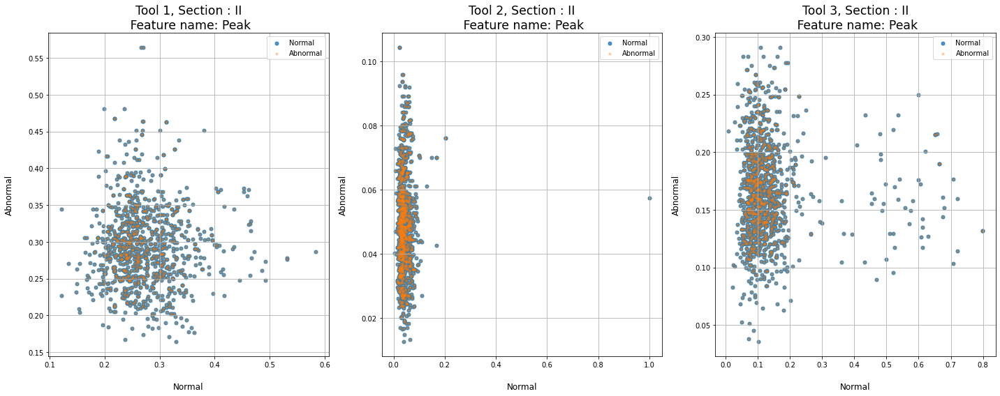

(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)
(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)


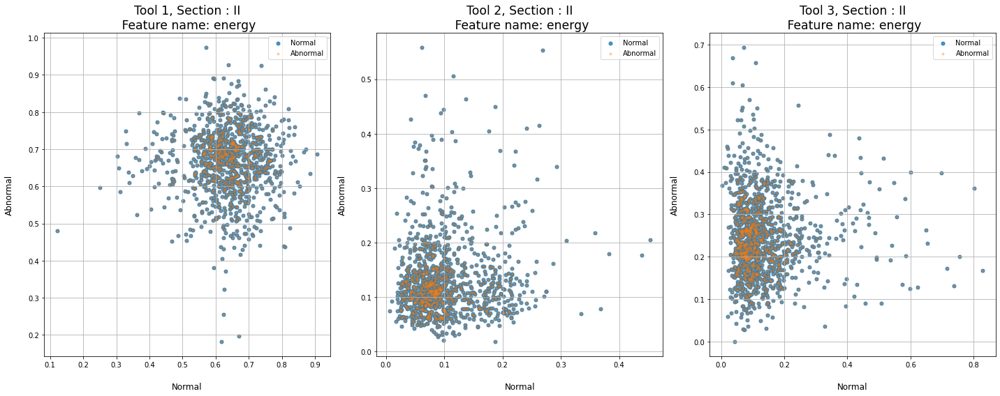

(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)
(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)


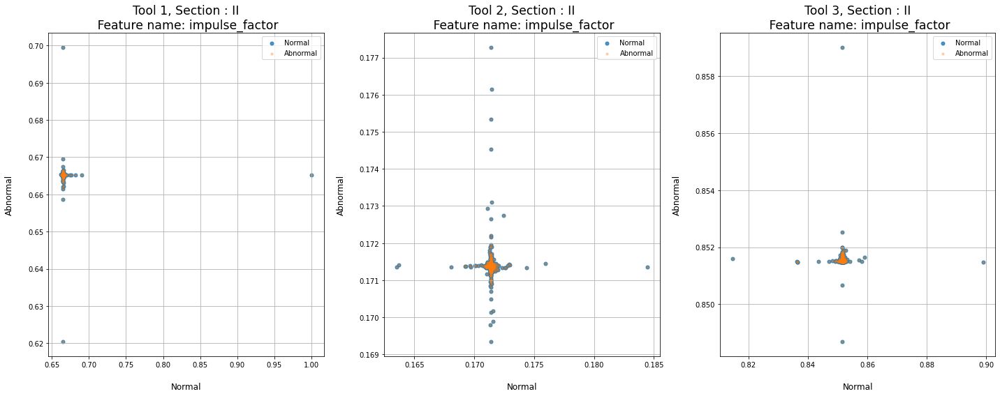

(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)
(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)


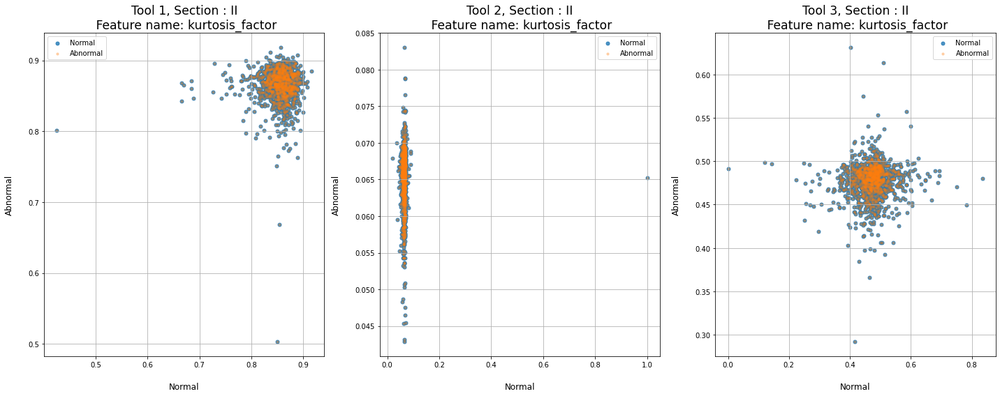

(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)
(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)


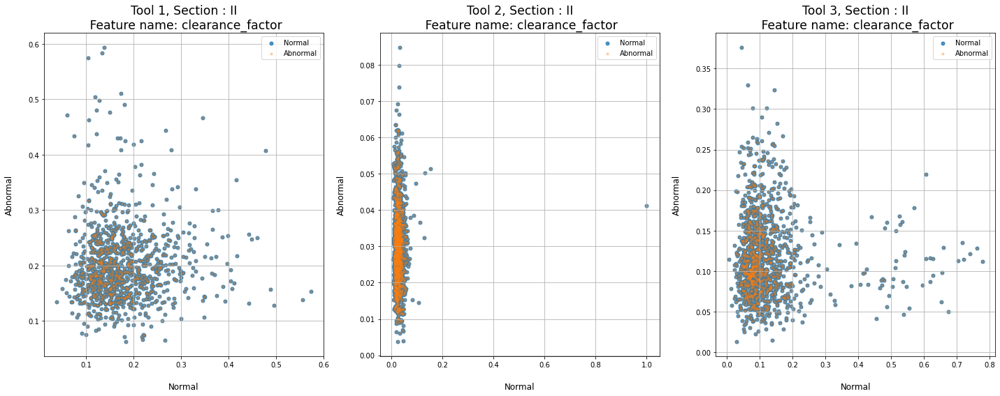

(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)
(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)


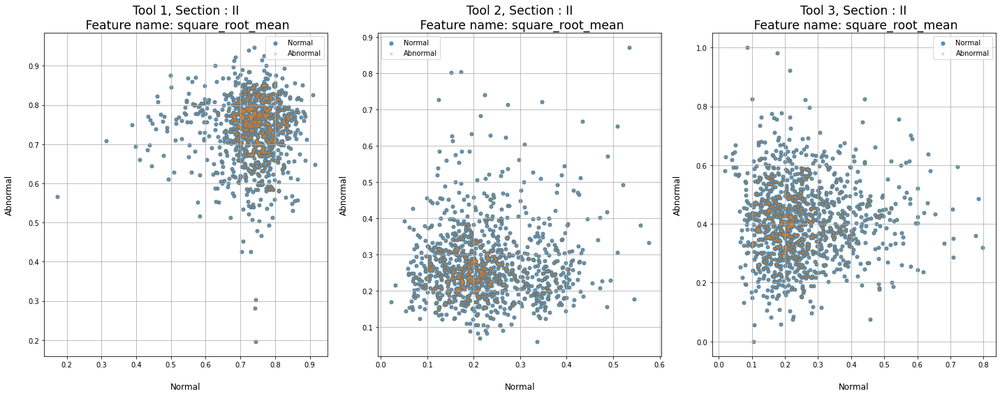

(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)
(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)


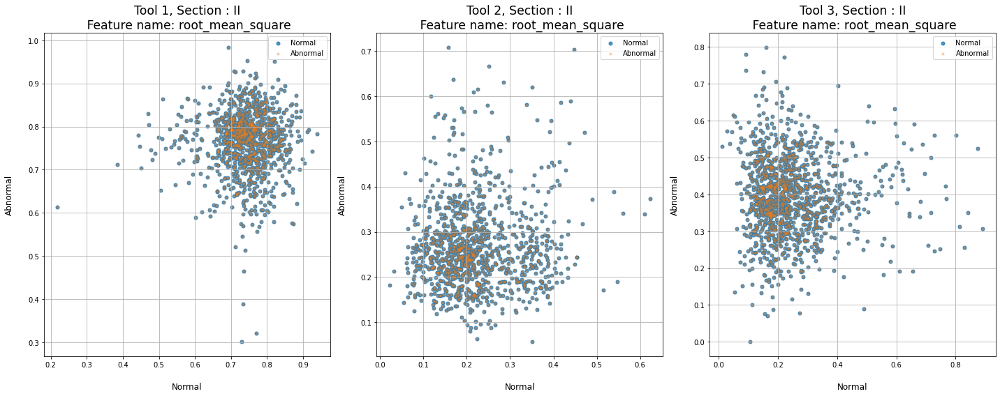

(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)
(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)


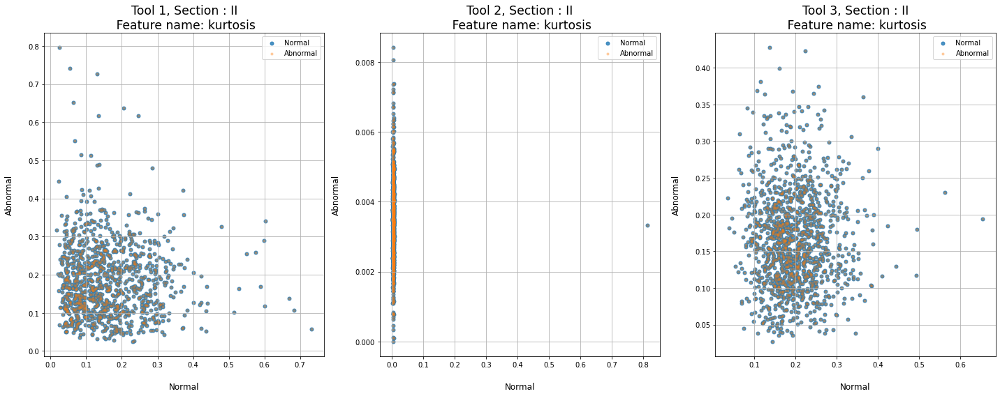

(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)
(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)


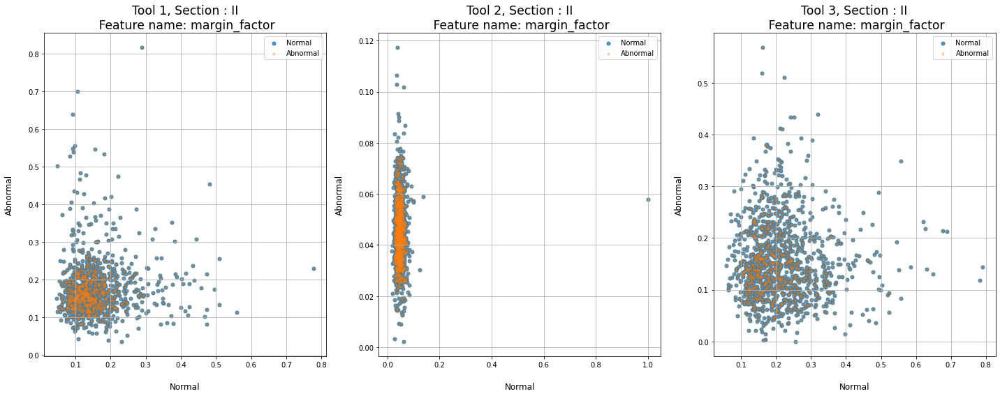

(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)
(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)


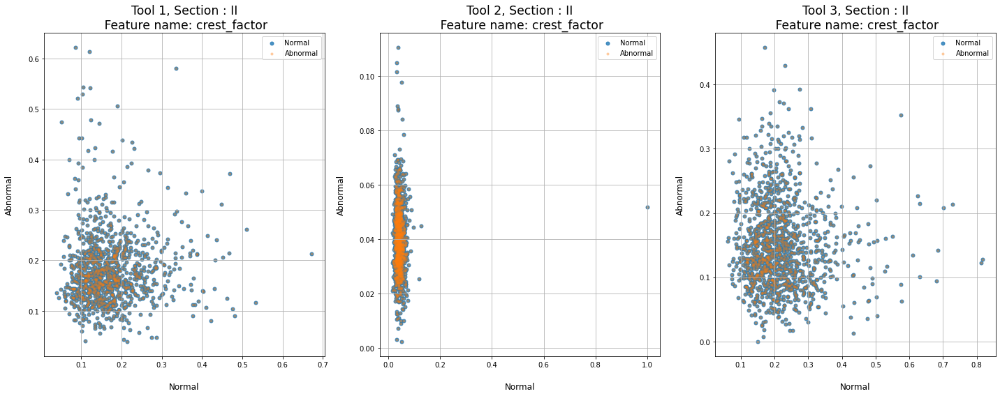

(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)
(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)


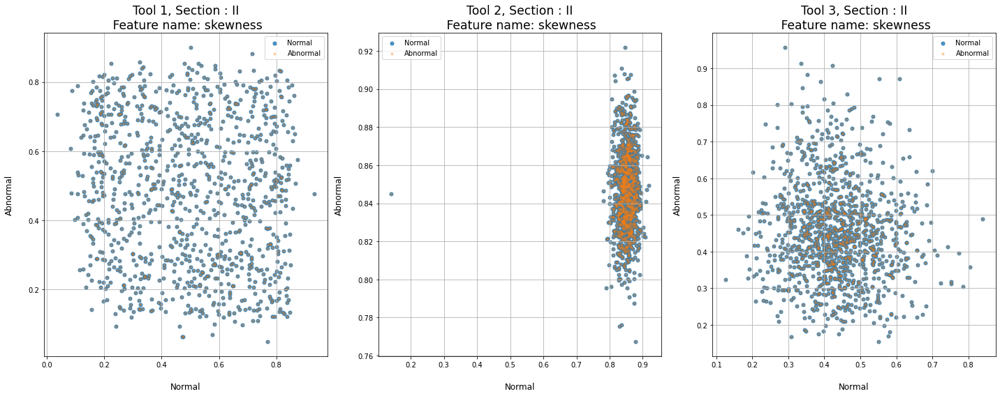

(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)
(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)


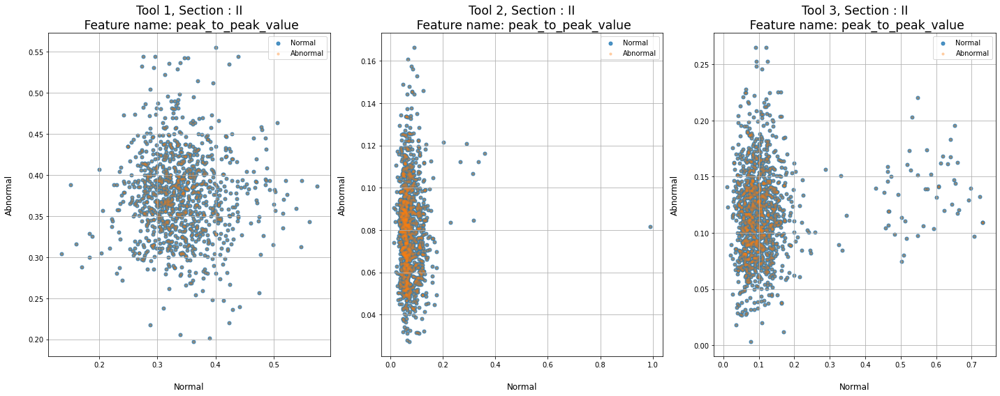

(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)
(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)


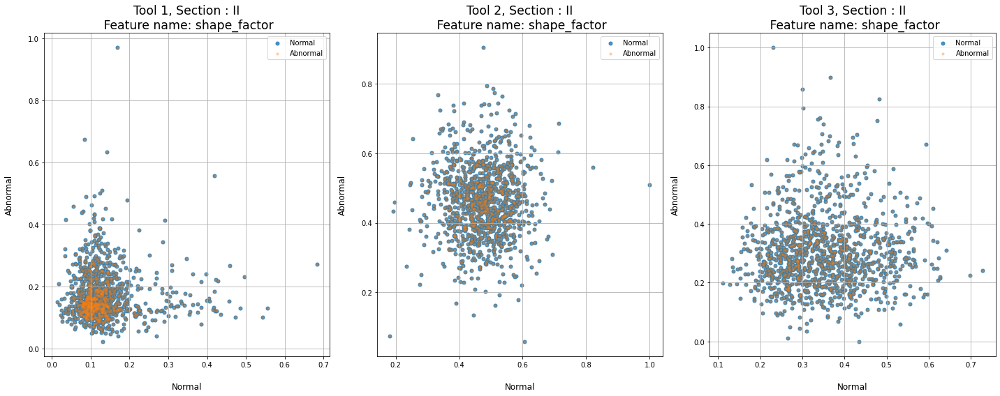

(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)
(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)


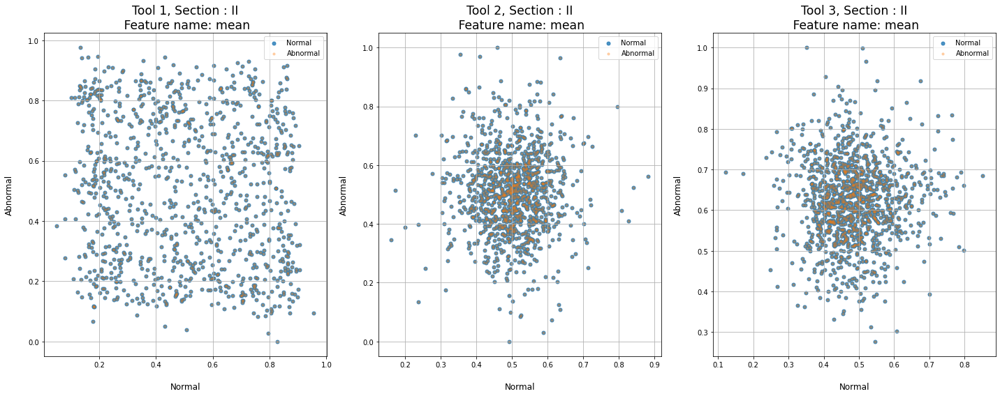

(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)
(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)


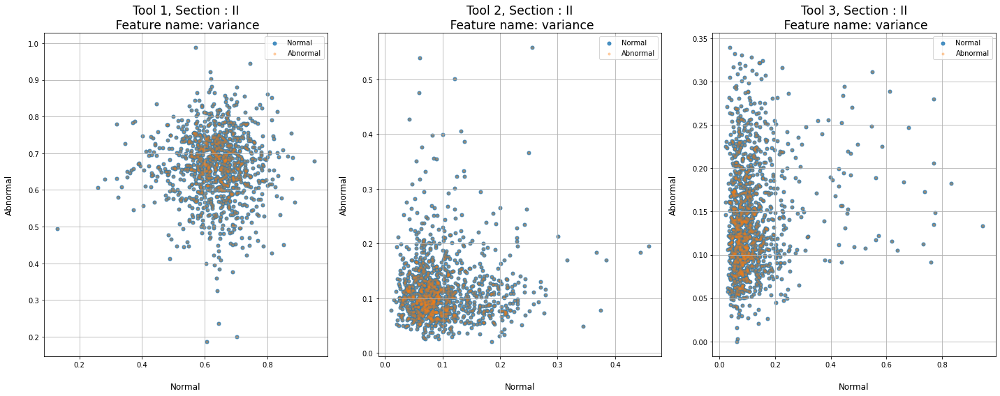

(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)
(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)


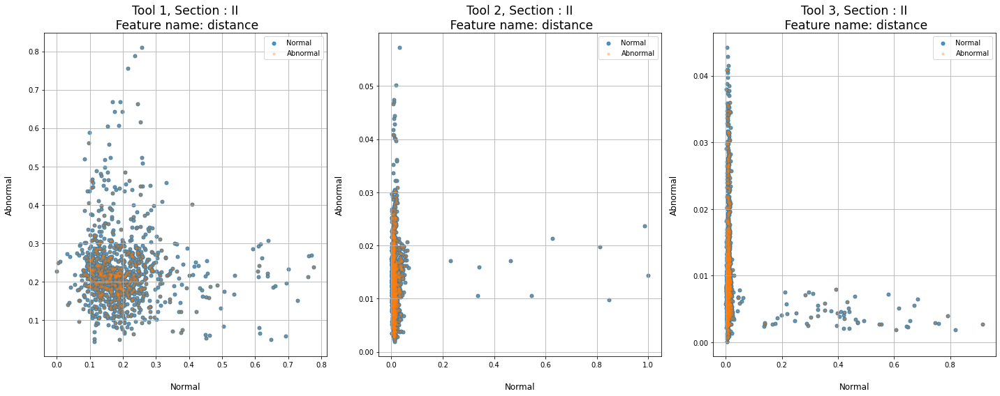

(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)
(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)


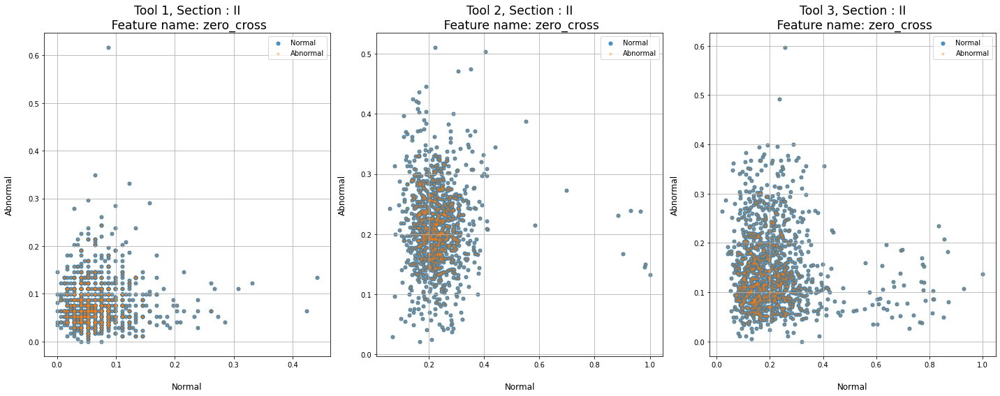

(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)
(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)


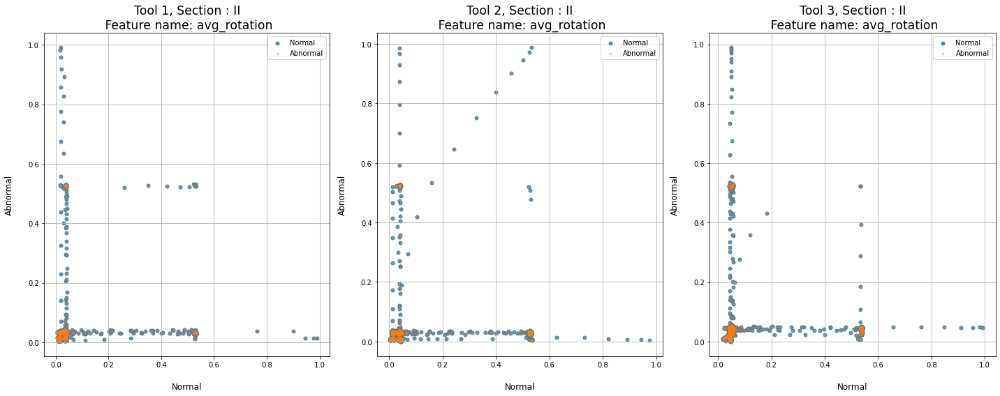

(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)
(996, 20) (16331, 20)
(1072, 20) (17699, 20)
(1175, 20) (18318, 20)
(3243, 20) (52348, 20)


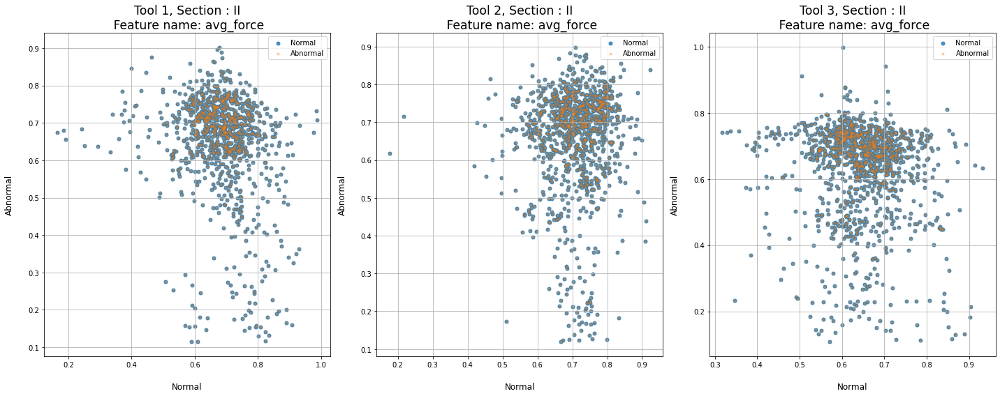

In [102]:
time_col_list=['Peak','energy','impulse_factor','kurtosis_factor','clearance_factor','square_root_mean','root_mean_square','kurtosis','margin_factor','crest_factor','skewness','peak_to_peak_value','shape_factor','mean','variance','distance','zero_cross','avg_rotation','avg_force','label']

for col,col_name in enumerate(time_col_list[:-1]):

    # splitting train into cavity and not cavity dataframe

    normal_dataset_05,cavity_dataset_05=split_cavity_not(combined_05_II)
    normal_dataset_06,cavity_dataset_06=split_cavity_not(combined_06_II)
    normal_dataset_11,cavity_dataset_11=split_cavity_not(combined_11_II)
    normal_dataset_combined,cavity_dataset_combined=split_cavity_not(combined_II)

    print(normal_dataset_05.shape,cavity_dataset_05.shape)
    print(normal_dataset_06.shape,cavity_dataset_06.shape)
    print(normal_dataset_11.shape,cavity_dataset_11.shape)
    print(normal_dataset_combined.shape,cavity_dataset_combined.shape)

    plot_shape_05=get_max_plot(normal_dataset_05.shape[0], cavity_dataset_05.shape[0])
    plot_shape_06=get_max_plot(normal_dataset_06.shape[0], cavity_dataset_06.shape[0])
    plot_shape_11=get_max_plot(normal_dataset_11.shape[0], cavity_dataset_11.shape[0])
    plot_shape_combined=get_max_plot(normal_dataset_combined.shape[0], cavity_dataset_combined.shape[0])
   
    fig,ax=plt.subplots(1,3,figsize=(20,8) )

    ax[0].scatter(normal_dataset_05.iloc[:plot_shape_05,[col]], cavity_dataset_05.iloc[:plot_shape_05,[col]], s=25, c='tab:blue', marker='o', alpha=0.8 ,label='Normal')
    ax[0].scatter(normal_dataset_05.iloc[:plot_shape_05,[col]], cavity_dataset_05.iloc[:plot_shape_05,[col]], s=10, c='tab:orange', marker='o',alpha=0.3 ,label='Abnormal' )
    ax[0].set_xlabel("Normal", labelpad=20, size=12)
    ax[0].set_ylabel("Abnormal", labelpad=20, size=12)
    ax[0].legend()
    ax[0].grid(True)
    ax[0].set_title('Tool 1, Section : II\n Feature name: '+ col_name,fontsize='xx-large',y=1)

    ax[1].scatter(normal_dataset_06.iloc[:plot_shape_06,[col]], cavity_dataset_06.iloc[:plot_shape_06,[col]], s=25, c='tab:blue', marker='o', alpha=0.8 ,label='Normal')
    ax[1].scatter(normal_dataset_06.iloc[:plot_shape_06,[col]], cavity_dataset_06.iloc[:plot_shape_06,[col]], s=10, c='tab:orange', marker='o',alpha=0.3 ,label='Abnormal' )
    ax[1].set_xlabel("Normal", labelpad=20, size=12)
    ax[1].set_ylabel("Abnormal", labelpad=20, size=12)
    ax[1].legend()
    ax[1].grid(True)
    ax[1].set_title('Tool 2, Section : II\n Feature name: '+ col_name,fontsize='xx-large',y=1)

    ax[2].scatter(normal_dataset_11.iloc[:plot_shape_11,[col]], cavity_dataset_11.iloc[:plot_shape_11,[col]], s=25, c='tab:blue', marker='o', alpha=0.8 ,label='Normal')
    ax[2].scatter(normal_dataset_11.iloc[:plot_shape_11,[col]], cavity_dataset_11.iloc[:plot_shape_11,[col]], s=10, c='tab:orange', marker='o',alpha=0.3 ,label='Abnormal' )
    ax[2].set_xlabel("Normal", labelpad=20, size=12)
    ax[2].set_ylabel("Abnormal", labelpad=20, size=12)
    ax[2].legend()
    ax[2].grid(True)
    ax[2].set_title('Tool 3, Section : II\n Feature name: '+ col_name,fontsize='xx-large',y=1)

    # ax[3].scatter(normal_dataset_combined.iloc[:plot_shape_combined,[col]], cavity_dataset_combined.iloc[:plot_shape_combined,[col]], s=25, c='tab:blue', marker='o', alpha=0.8 ,label='Not cavity')
    # ax[3].scatter(normal_dataset_combined.iloc[:plot_shape_combined,[col]], cavity_dataset_combined.iloc[:plot_shape_combined,[col]], s=10, c='tab:orange', marker='o',alpha=0.3 ,label='Cavity' )
    # ax[3].set_xlabel("Not cavity", labelpad=20, size=12)
    # ax[3].set_ylabel("Cavity", labelpad=20, size=12)
    # ax[3].legend()
    # ax[3].grid(True)
    # ax[3].set_title('Tool: Combined \n Section : II\n Feature name: '+ col_name,fontsize='xx-large',y=1)
    # plt.suptitle('Tool: '+folder+ ', Section : II, Feature name: '+ time_col_list[col],fontsize='xx-large',y=1)
    plt.tight_layout()
    plt.show()

# Section III scatter plot 

(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)
(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)


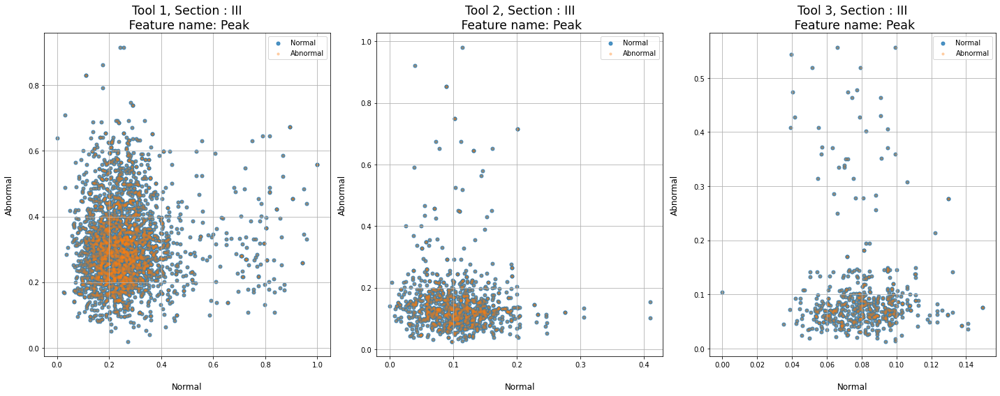

(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)
(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)


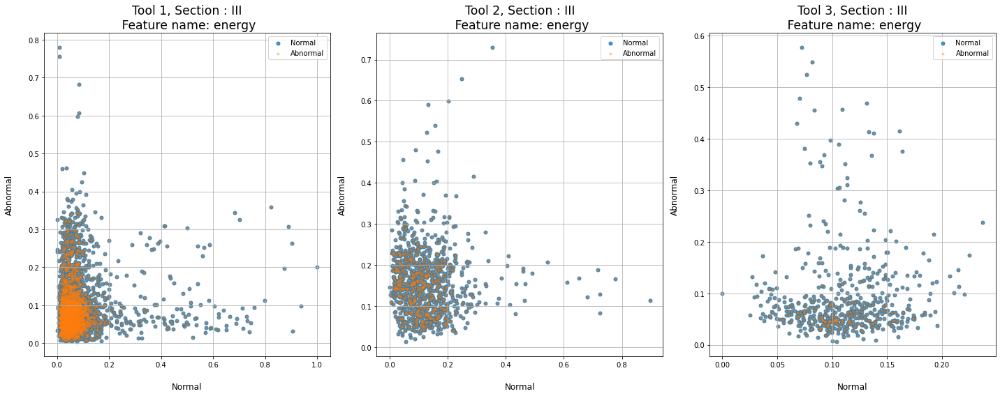

(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)
(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)


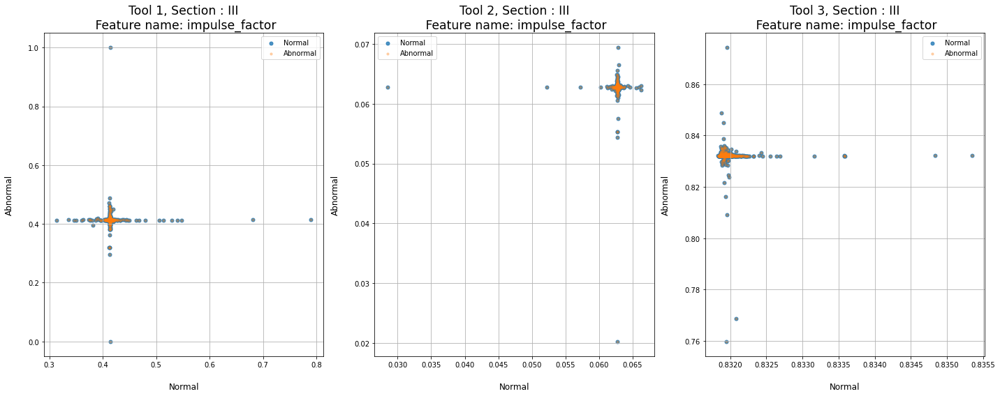

(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)
(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)


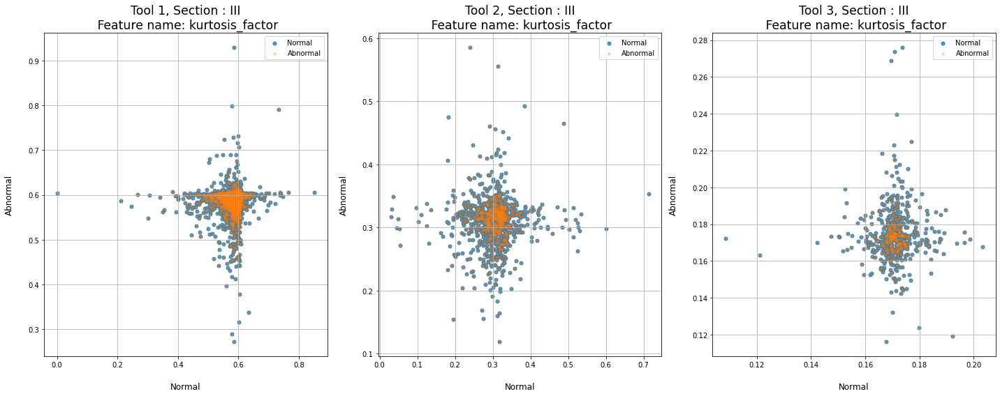

(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)
(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)


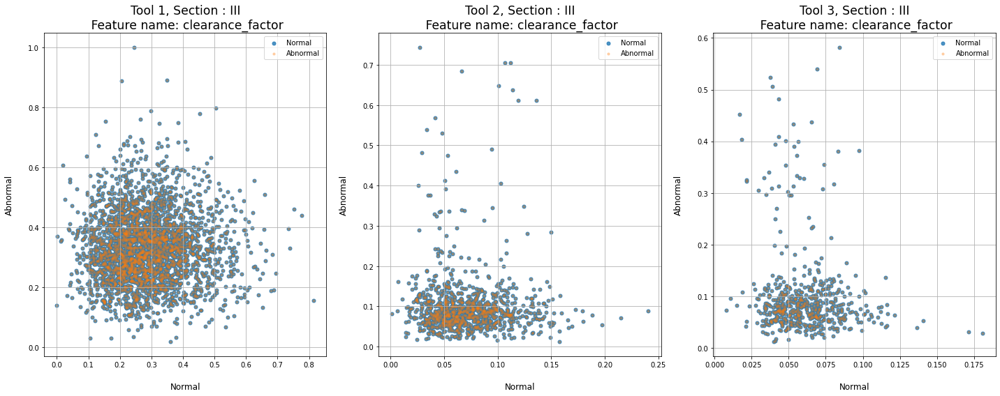

(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)
(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)


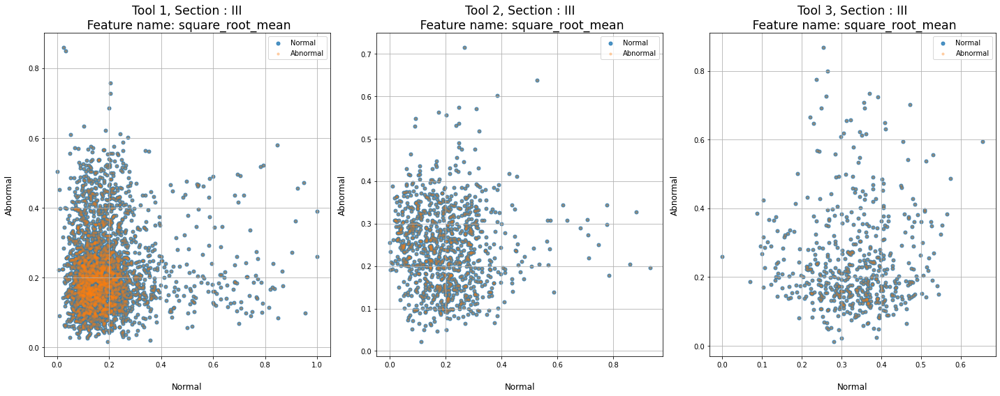

(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)
(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)


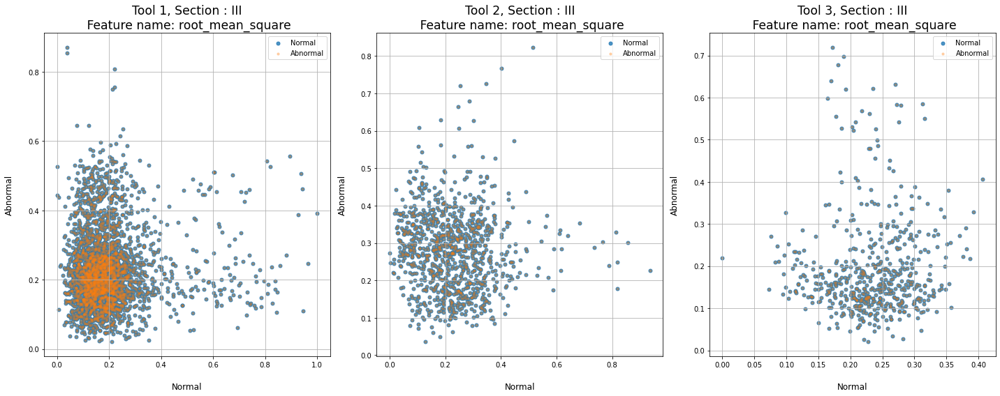

(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)
(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)


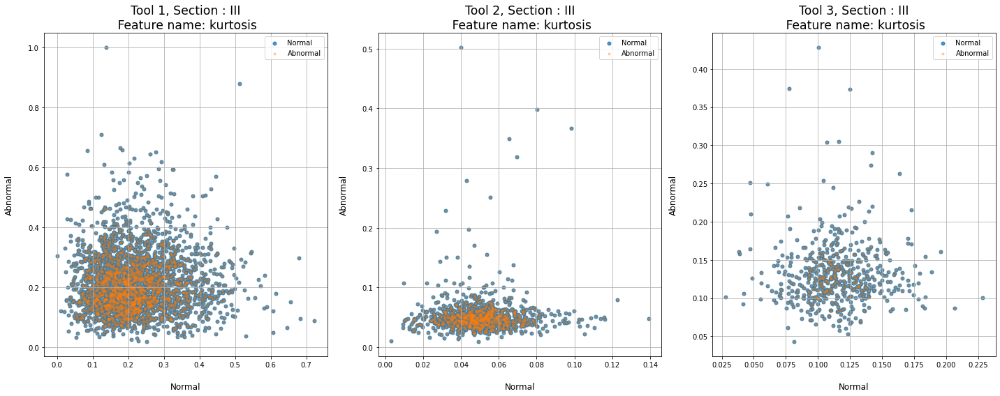

(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)
(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)


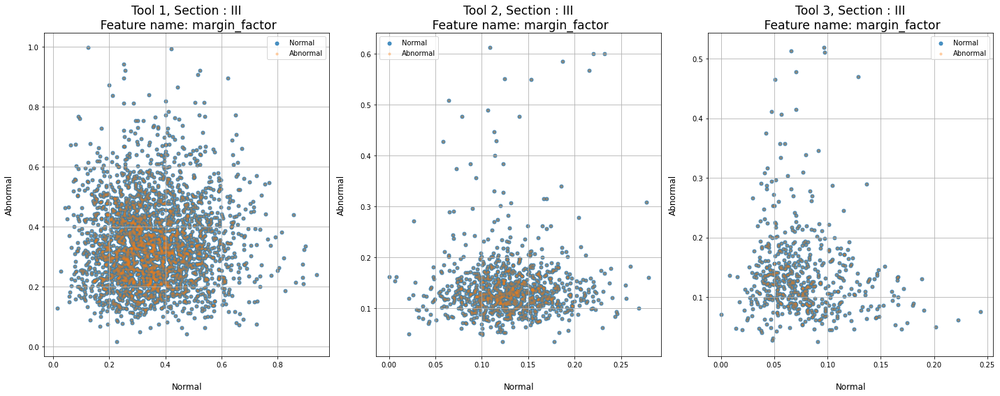

(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)
(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)


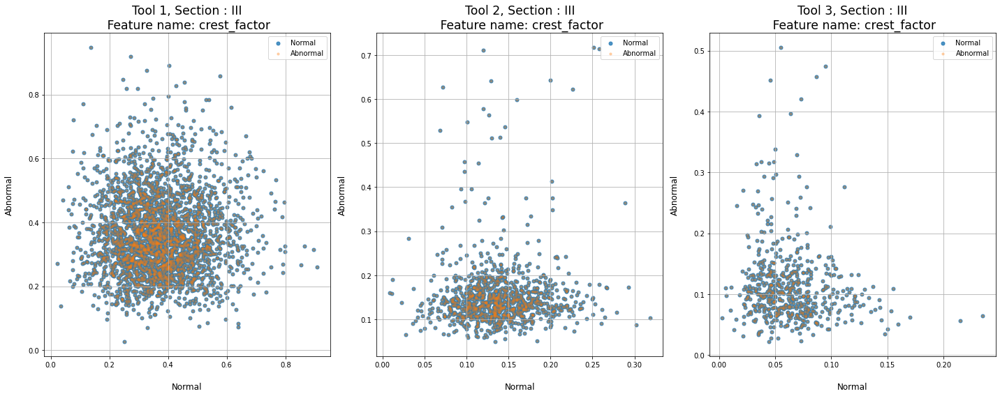

(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)
(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)


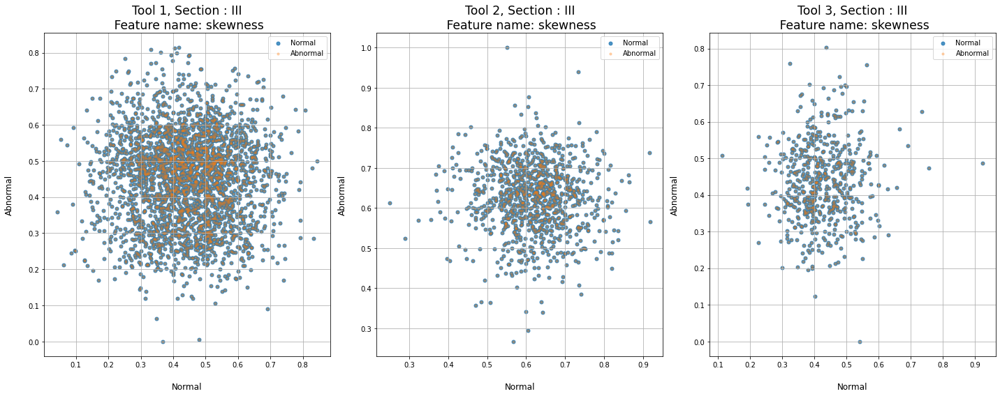

(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)
(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)


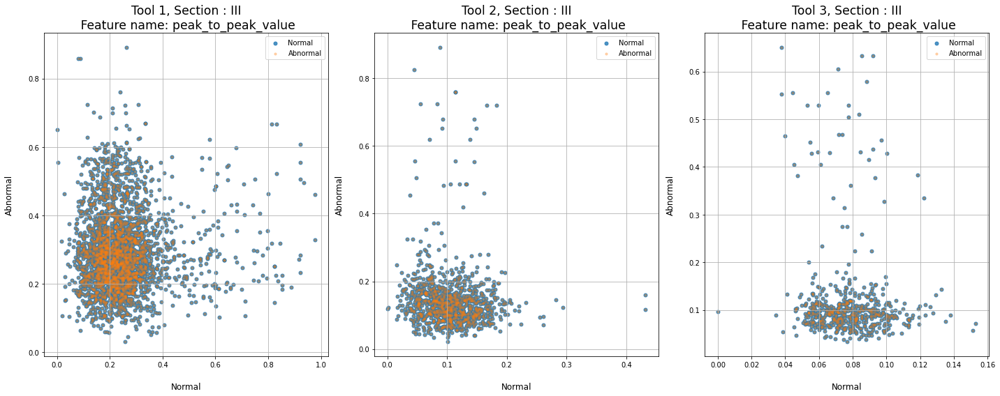

(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)
(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)


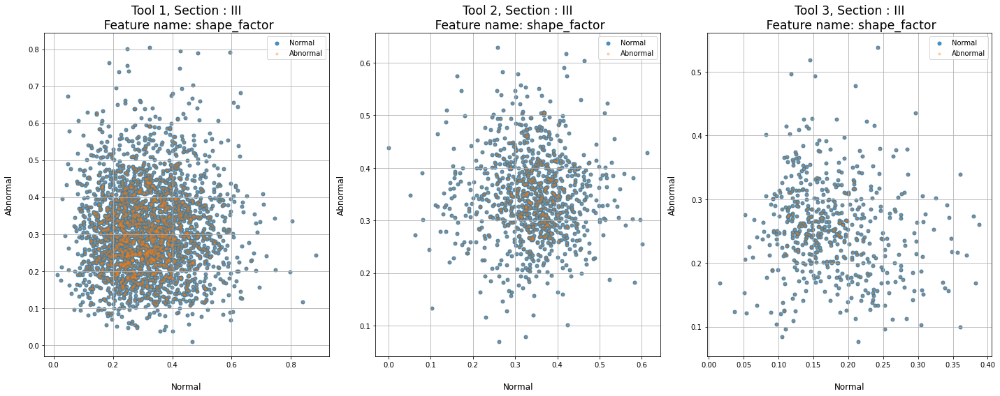

(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)
(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)


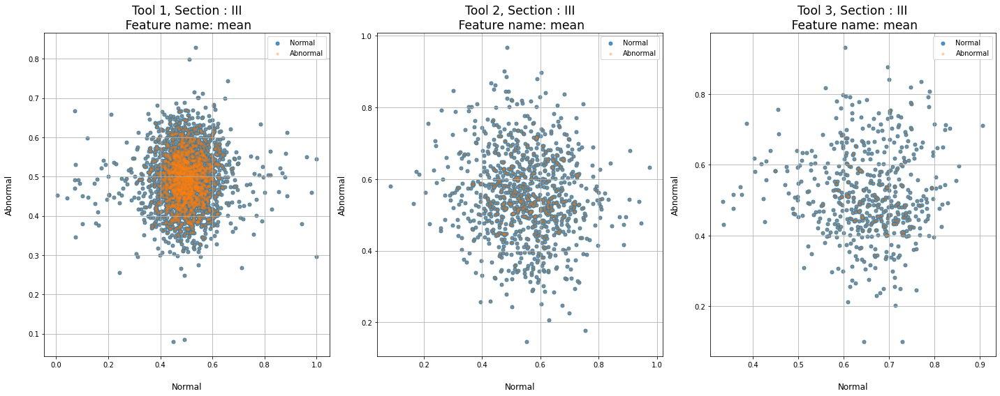

(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)
(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)


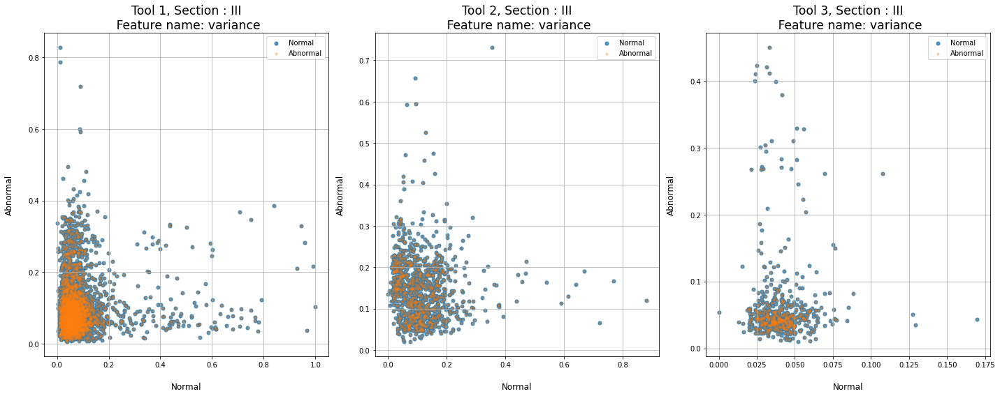

(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)
(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)


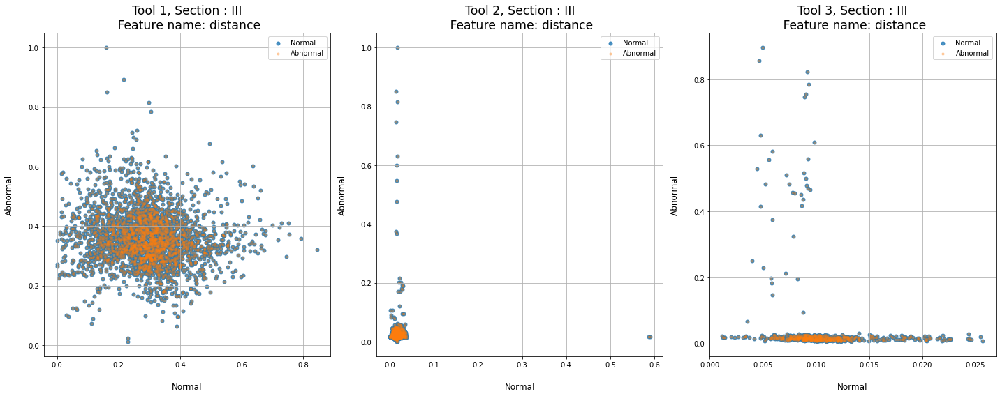

(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)
(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)


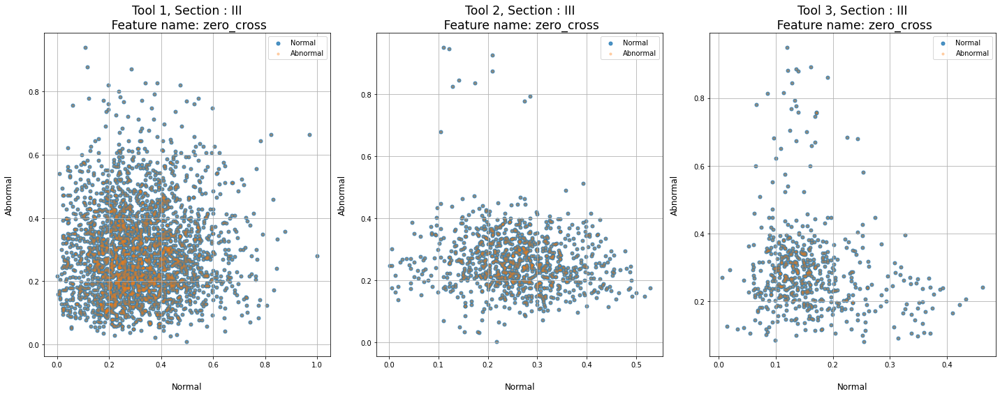

(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)
(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)


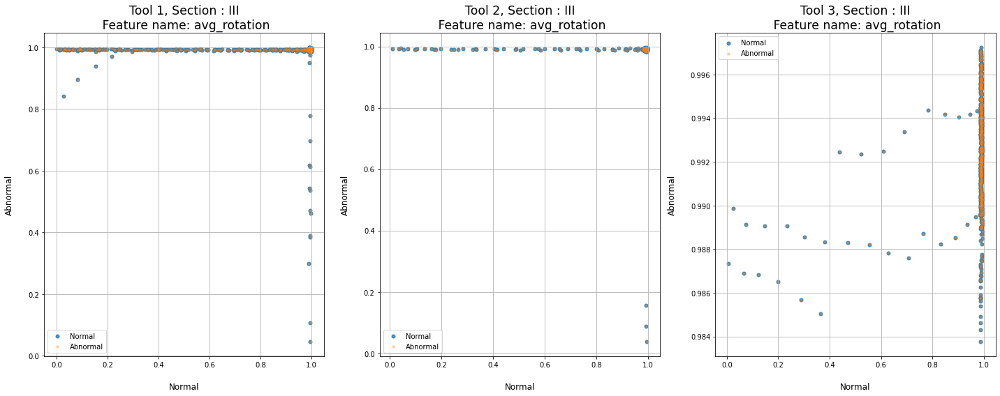

(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)
(3499, 20) (2668, 20)
(5725, 20) (956, 20)
(6400, 20) (538, 20)
(15624, 20) (4162, 20)


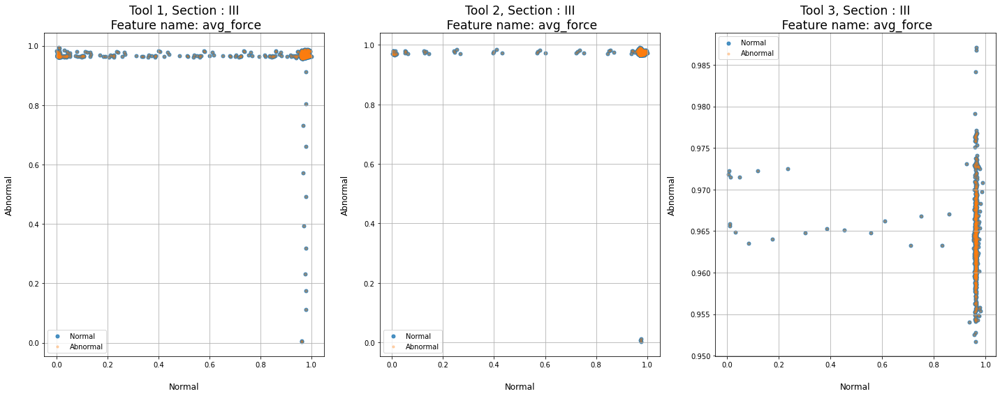

In [103]:
time_col_list=['Peak','energy','impulse_factor','kurtosis_factor','clearance_factor','square_root_mean','root_mean_square','kurtosis','margin_factor','crest_factor','skewness','peak_to_peak_value','shape_factor','mean','variance','distance','zero_cross','avg_rotation','avg_force','label']

for col,col_name in enumerate(time_col_list[:-1]):

    # splitting train into cavity and not cavity dataframe

    normal_dataset_05,cavity_dataset_05=split_cavity_not(combined_05_III)
    normal_dataset_06,cavity_dataset_06=split_cavity_not(combined_06_III)
    normal_dataset_11,cavity_dataset_11=split_cavity_not(combined_11_III)
    normal_dataset_combined,cavity_dataset_combined=split_cavity_not(combined_III)

    print(normal_dataset_05.shape,cavity_dataset_05.shape)
    print(normal_dataset_06.shape,cavity_dataset_06.shape)
    print(normal_dataset_11.shape,cavity_dataset_11.shape)
    print(normal_dataset_combined.shape,cavity_dataset_combined.shape)

    plot_shape_05=get_max_plot(normal_dataset_05.shape[0], cavity_dataset_05.shape[0])
    plot_shape_06=get_max_plot(normal_dataset_06.shape[0], cavity_dataset_06.shape[0])
    plot_shape_11=get_max_plot(normal_dataset_11.shape[0], cavity_dataset_11.shape[0])
    plot_shape_combined=get_max_plot(normal_dataset_combined.shape[0], cavity_dataset_combined.shape[0])
   
    fig,ax=plt.subplots(1,3,figsize=(20,8) )

    ax[0].scatter(normal_dataset_05.iloc[:plot_shape_05,[col]], cavity_dataset_05.iloc[:plot_shape_05,[col]], s=25, c='tab:blue', marker='o', alpha=0.8 ,label='Normal')
    ax[0].scatter(normal_dataset_05.iloc[:plot_shape_05,[col]], cavity_dataset_05.iloc[:plot_shape_05,[col]], s=10, c='tab:orange', marker='o',alpha=0.3 ,label='Abnormal' )
    ax[0].set_xlabel("Normal", labelpad=20, size=12)
    ax[0].set_ylabel("Abnormal", labelpad=20, size=12)
    ax[0].legend()
    ax[0].grid(True)
    ax[0].set_title('Tool 1, Section : III\n Feature name: '+ col_name,fontsize='xx-large',y=1)

    ax[1].scatter(normal_dataset_06.iloc[:plot_shape_06,[col]], cavity_dataset_06.iloc[:plot_shape_06,[col]], s=25, c='tab:blue', marker='o', alpha=0.8 ,label='Normal')
    ax[1].scatter(normal_dataset_06.iloc[:plot_shape_06,[col]], cavity_dataset_06.iloc[:plot_shape_06,[col]], s=10, c='tab:orange', marker='o',alpha=0.3 ,label='Abnormal' )
    ax[1].set_xlabel("Normal", labelpad=20, size=12)
    ax[1].set_ylabel("Abnormal", labelpad=20, size=12)
    ax[1].legend()
    ax[1].grid(True)
    ax[1].set_title('Tool 2, Section : III\n Feature name: '+ col_name,fontsize='xx-large',y=1)

    ax[2].scatter(normal_dataset_11.iloc[:plot_shape_11,[col]], cavity_dataset_11.iloc[:plot_shape_11,[col]], s=25, c='tab:blue', marker='o', alpha=0.8 ,label='Normal')
    ax[2].scatter(normal_dataset_11.iloc[:plot_shape_11,[col]], cavity_dataset_11.iloc[:plot_shape_11,[col]], s=10, c='tab:orange', marker='o',alpha=0.3 ,label='Abnormal' )
    ax[2].set_xlabel("Normal", labelpad=20, size=12)
    ax[2].set_ylabel("Abnormal", labelpad=20, size=12)
    ax[2].legend()
    ax[2].grid(True)
    ax[2].set_title('Tool 3, Section : III\n Feature name: '+ col_name,fontsize='xx-large',y=1)

    # ax[3].scatter(normal_dataset_combined.iloc[:plot_shape_combined,[col]], cavity_dataset_combined.iloc[:plot_shape_combined,[col]], s=25, c='tab:blue', marker='o', alpha=0.8 ,label='Not cavity')
    # ax[3].scatter(normal_dataset_combined.iloc[:plot_shape_combined,[col]], cavity_dataset_combined.iloc[:plot_shape_combined,[col]], s=10, c='tab:orange', marker='o',alpha=0.3 ,label='Cavity' )
    # ax[3].set_xlabel("Not cavity", labelpad=20, size=12)
    # ax[3].set_ylabel("Cavity", labelpad=20, size=12)
    # ax[3].legend()
    # ax[3].grid(True)
    # ax[3].set_title('Tool: Combined \n Section : II\n Feature name: '+ col_name,fontsize='xx-large',y=1)
    # plt.suptitle('Tool: '+folder+ ', Section : II, Feature name: '+ time_col_list[col],fontsize='xx-large',y=1)
    plt.tight_layout()
    plt.show()

# section IV scatter plot

(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)
(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)


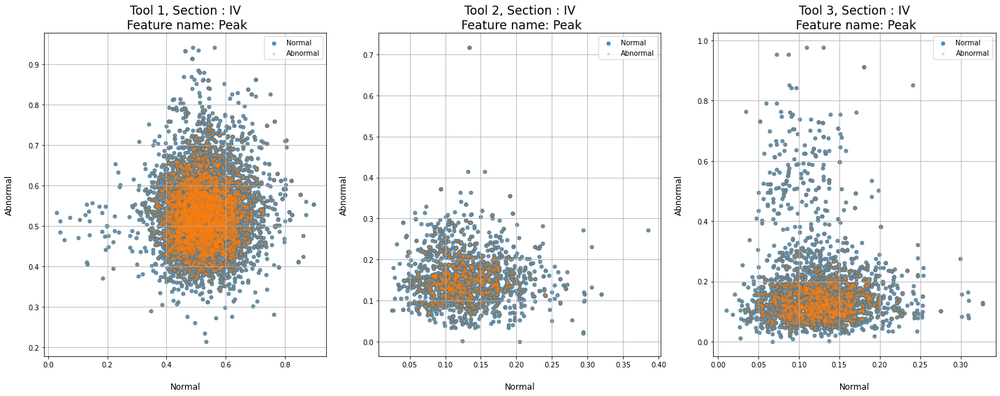

(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)
(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)


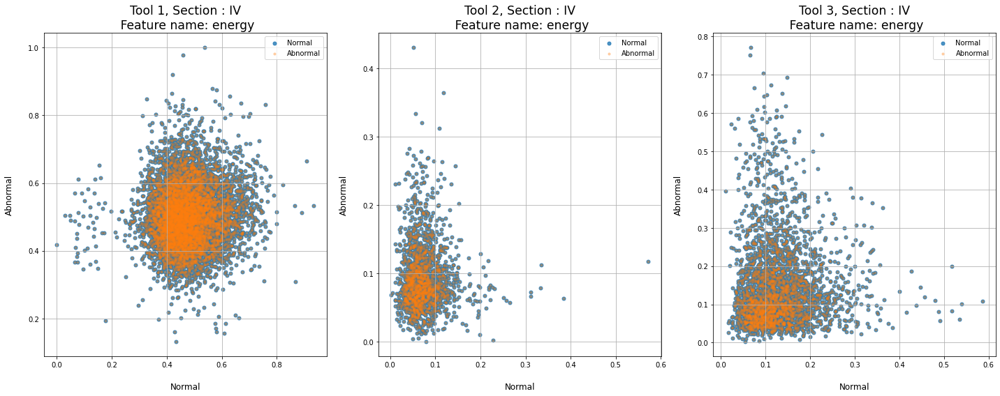

(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)
(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)


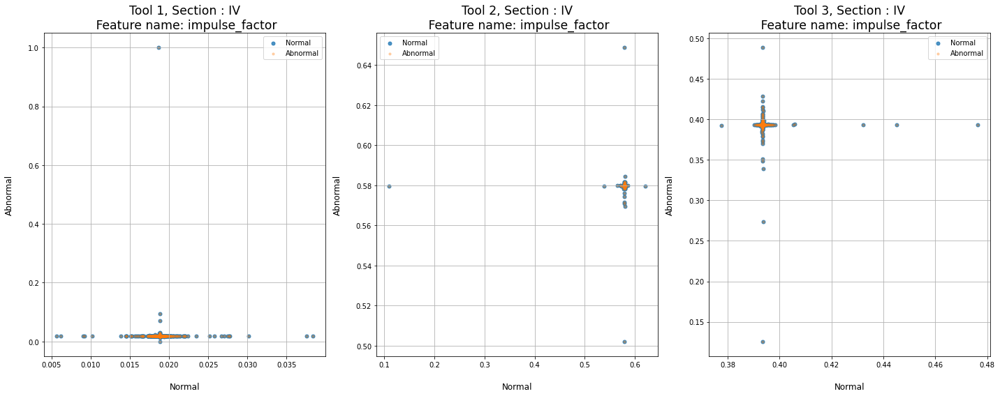

(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)
(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)


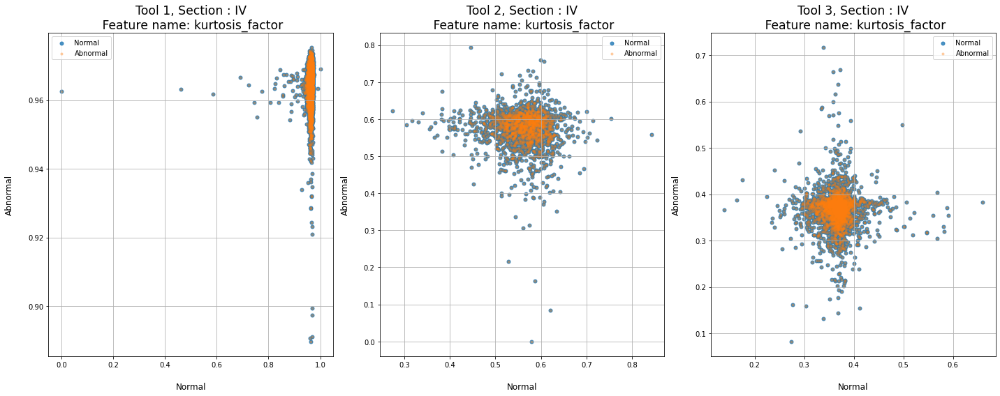

(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)
(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)


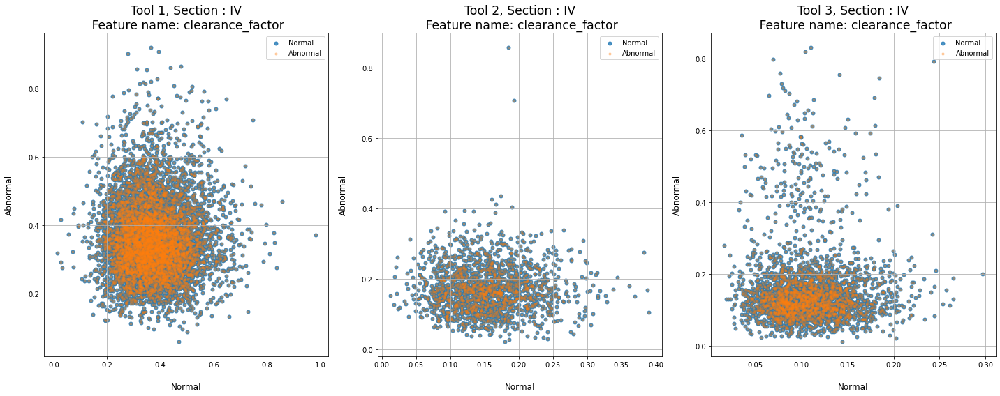

(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)
(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)


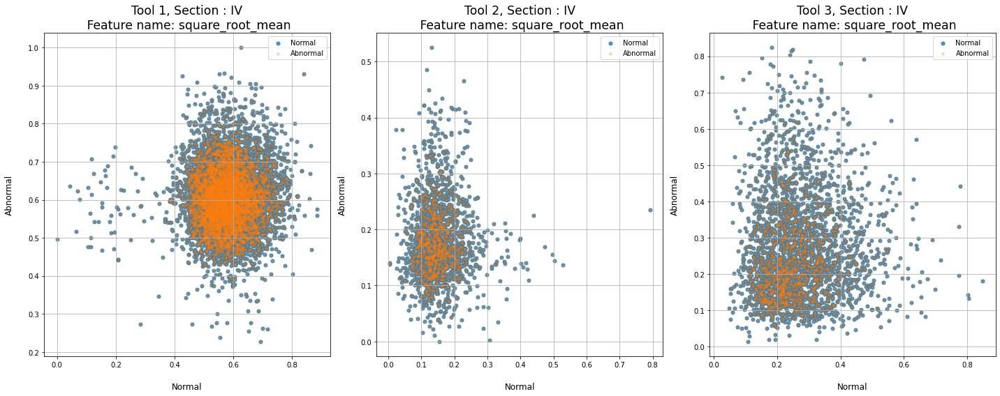

(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)
(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)


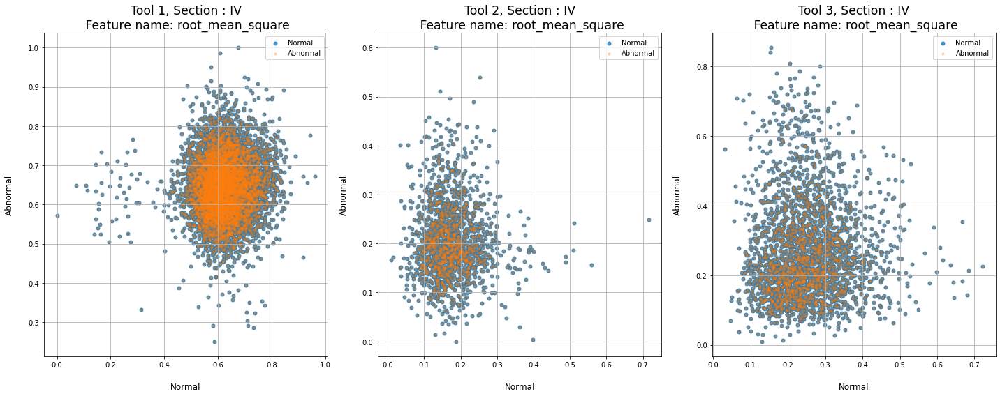

(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)
(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)


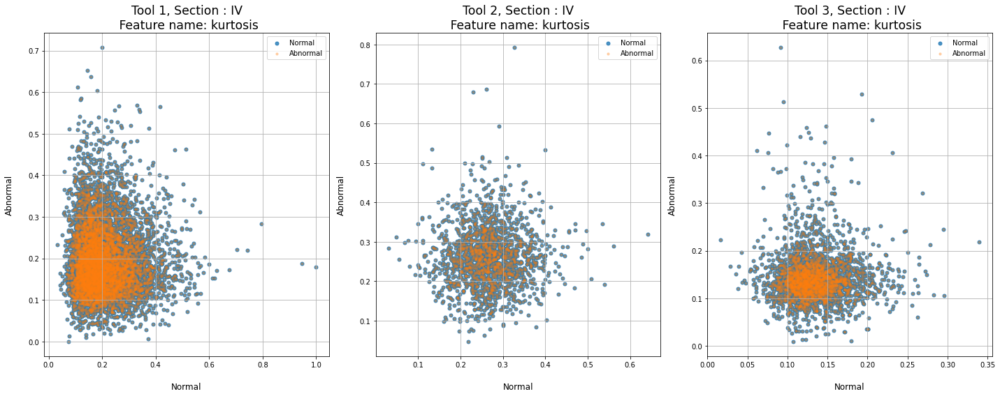

(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)
(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)


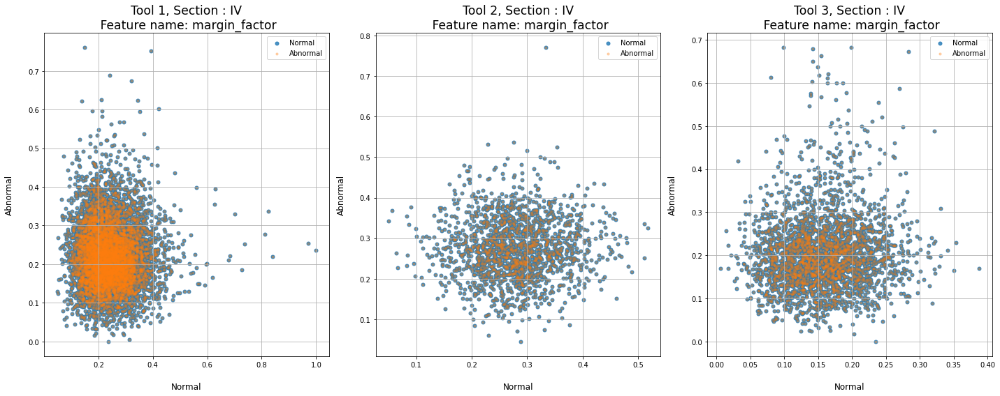

(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)
(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)


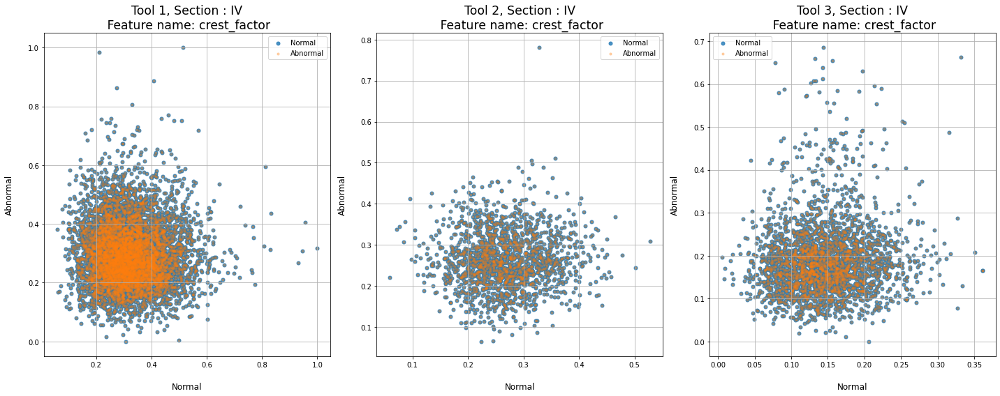

(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)
(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)


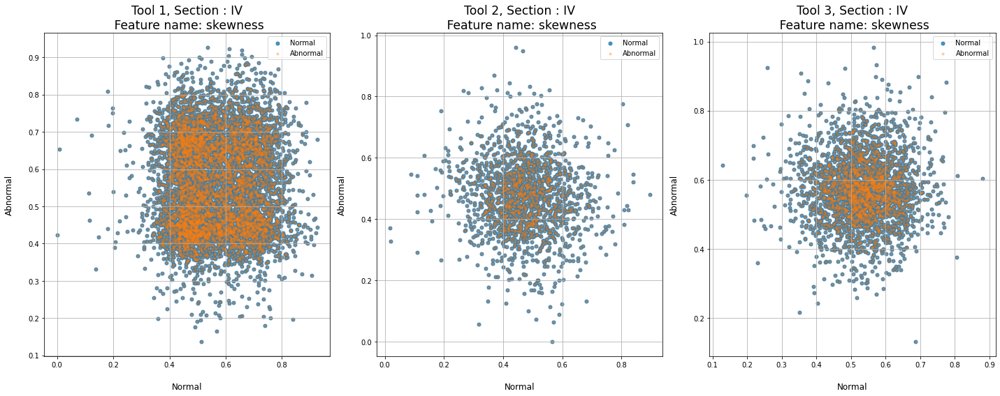

(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)
(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)


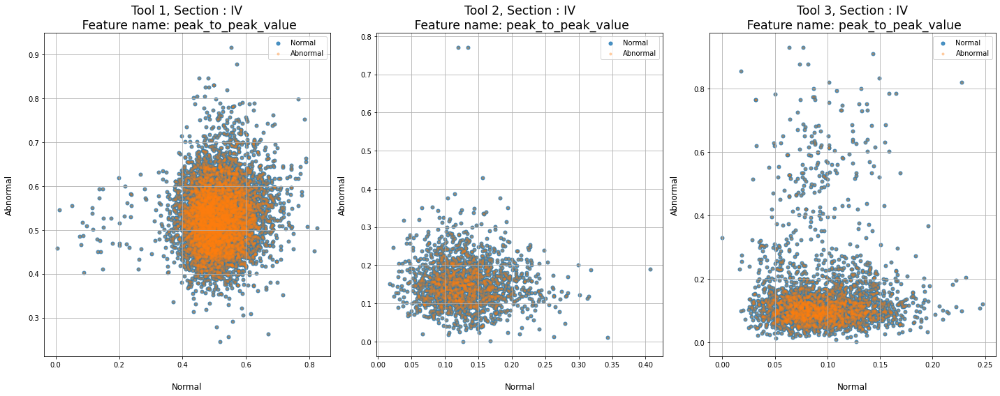

(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)
(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)


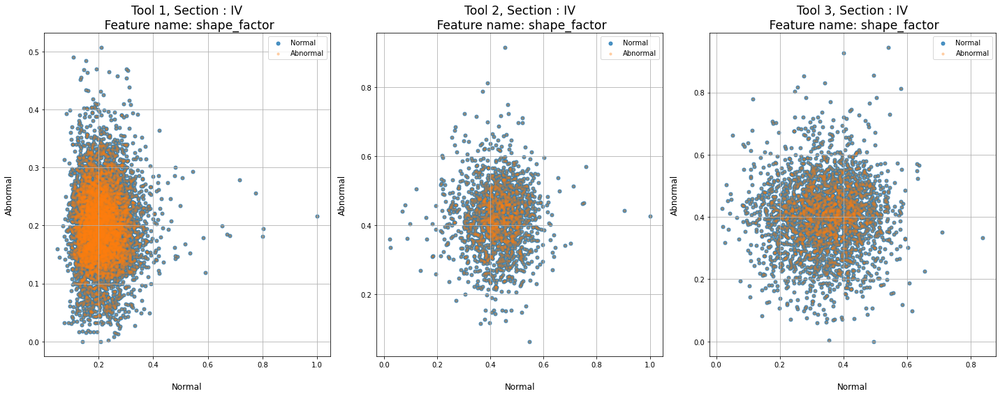

(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)
(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)


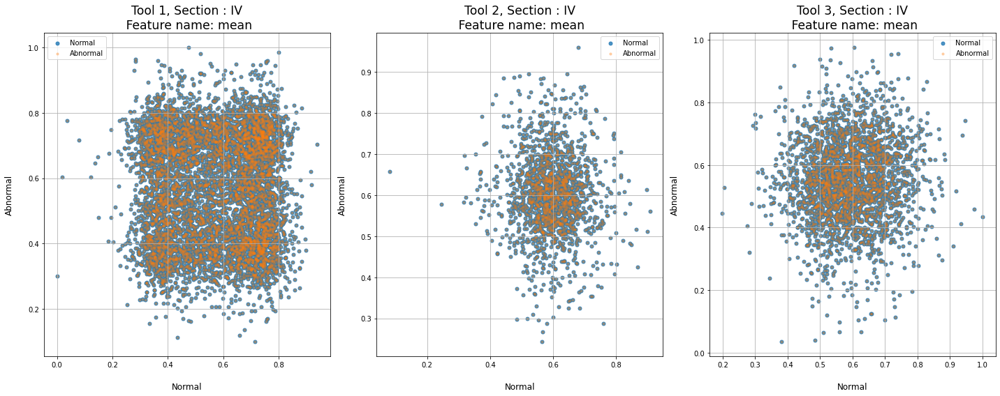

(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)
(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)


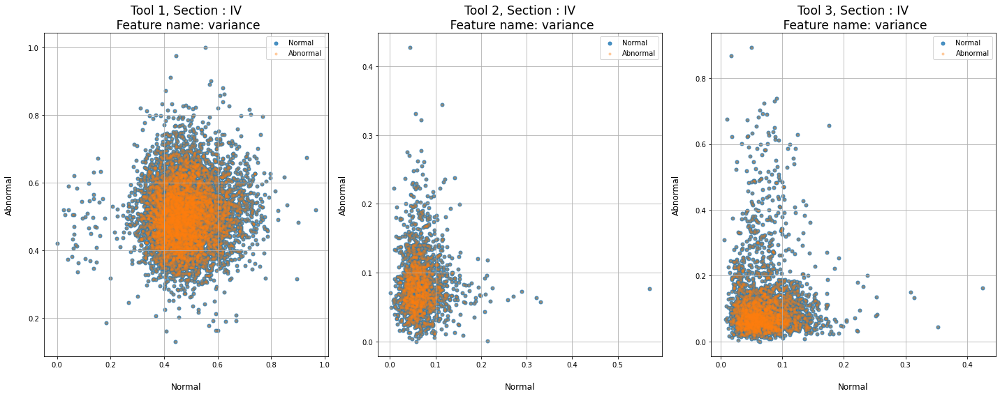

(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)
(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)


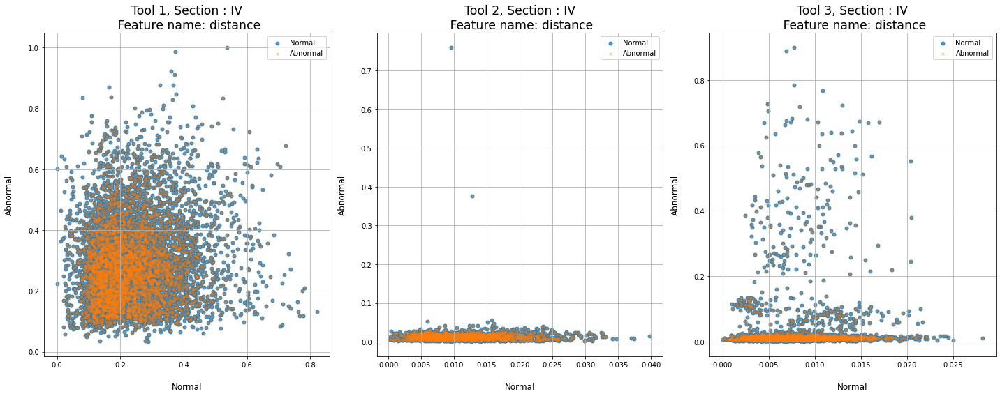

(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)
(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)


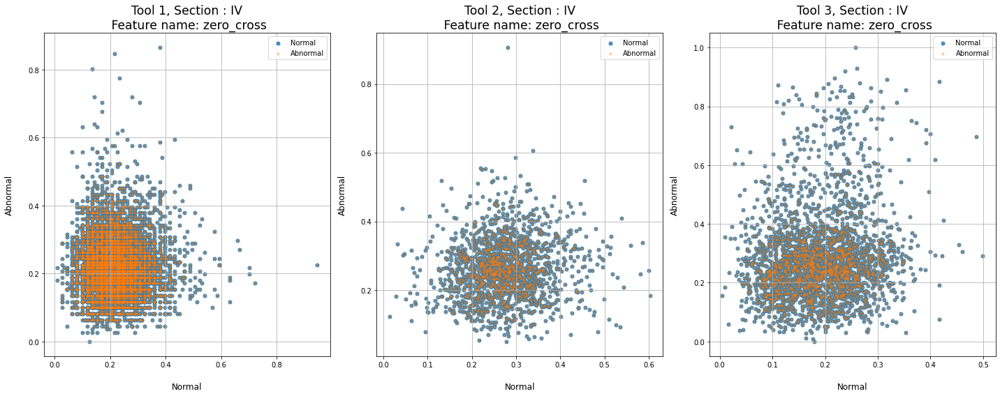

(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)
(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)


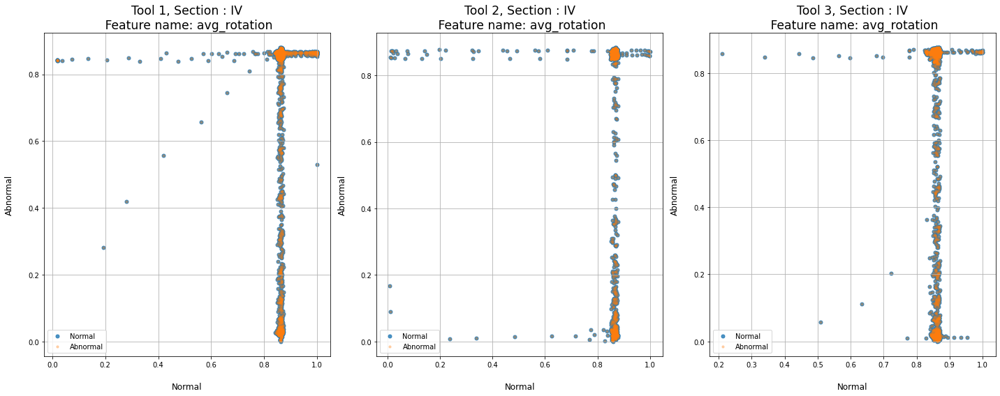

(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)
(10980, 20) (6443, 20)
(17239, 20) (1636, 20)
(16950, 20) (2651, 20)
(45169, 20) (10730, 20)


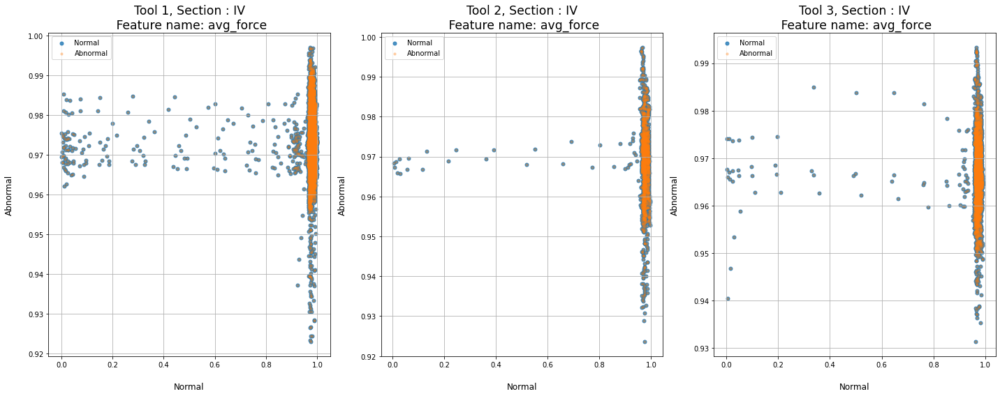

In [104]:
time_col_list=['Peak','energy','impulse_factor','kurtosis_factor','clearance_factor','square_root_mean','root_mean_square','kurtosis','margin_factor','crest_factor','skewness','peak_to_peak_value','shape_factor','mean','variance','distance','zero_cross','avg_rotation','avg_force','label']

for col,col_name in enumerate(time_col_list[:-1]):

    # splitting train into cavity and not cavity dataframe

    normal_dataset_05,cavity_dataset_05=split_cavity_not(combined_05_IV)
    normal_dataset_06,cavity_dataset_06=split_cavity_not(combined_06_IV)
    normal_dataset_11,cavity_dataset_11=split_cavity_not(combined_11_IV)
    normal_dataset_combined,cavity_dataset_combined=split_cavity_not(combined_IV)

    print(normal_dataset_05.shape,cavity_dataset_05.shape)
    print(normal_dataset_06.shape,cavity_dataset_06.shape)
    print(normal_dataset_11.shape,cavity_dataset_11.shape)
    print(normal_dataset_combined.shape,cavity_dataset_combined.shape)

    plot_shape_05=get_max_plot(normal_dataset_05.shape[0], cavity_dataset_05.shape[0])
    plot_shape_06=get_max_plot(normal_dataset_06.shape[0], cavity_dataset_06.shape[0])
    plot_shape_11=get_max_plot(normal_dataset_11.shape[0], cavity_dataset_11.shape[0])
    plot_shape_combined=get_max_plot(normal_dataset_combined.shape[0], cavity_dataset_combined.shape[0])
   
    fig,ax=plt.subplots(1,3,figsize=(20,8) )

    ax[0].scatter(normal_dataset_05.iloc[:plot_shape_05,[col]], cavity_dataset_05.iloc[:plot_shape_05,[col]], s=25, c='tab:blue', marker='o', alpha=0.8 ,label='Normal')
    ax[0].scatter(normal_dataset_05.iloc[:plot_shape_05,[col]], cavity_dataset_05.iloc[:plot_shape_05,[col]], s=10, c='tab:orange', marker='o',alpha=0.3 ,label='Abnormal' )
    ax[0].set_xlabel("Normal", labelpad=20, size=12)
    ax[0].set_ylabel("Abnormal", labelpad=20, size=12)
    ax[0].legend()
    ax[0].grid(True)
    ax[0].set_title('Tool 1, Section : IV\n Feature name: '+ col_name,fontsize='xx-large',y=1)

    ax[1].scatter(normal_dataset_06.iloc[:plot_shape_06,[col]], cavity_dataset_06.iloc[:plot_shape_06,[col]], s=25, c='tab:blue', marker='o', alpha=0.8 ,label='Normal')
    ax[1].scatter(normal_dataset_06.iloc[:plot_shape_06,[col]], cavity_dataset_06.iloc[:plot_shape_06,[col]], s=10, c='tab:orange', marker='o',alpha=0.3 ,label='Abnormal' )
    ax[1].set_xlabel("Normal", labelpad=20, size=12)
    ax[1].set_ylabel("Abnormal", labelpad=20, size=12)
    ax[1].legend()
    ax[1].grid(True)
    ax[1].set_title('Tool 2, Section : IV\n Feature name: '+ col_name,fontsize='xx-large',y=1)

    ax[2].scatter(normal_dataset_11.iloc[:plot_shape_11,[col]], cavity_dataset_11.iloc[:plot_shape_11,[col]], s=25, c='tab:blue', marker='o', alpha=0.8 ,label='Normal')
    ax[2].scatter(normal_dataset_11.iloc[:plot_shape_11,[col]], cavity_dataset_11.iloc[:plot_shape_11,[col]], s=10, c='tab:orange', marker='o',alpha=0.3 ,label='Abnormal' )
    ax[2].set_xlabel("Normal", labelpad=20, size=12)
    ax[2].set_ylabel("Abnormal", labelpad=20, size=12)
    ax[2].legend()
    ax[2].grid(True)
    ax[2].set_title('Tool 3, Section : IV\n Feature name: '+ col_name,fontsize='xx-large',y=1)

    # ax[3].scatter(normal_dataset_combined.iloc[:plot_shape_combined,[col]], cavity_dataset_combined.iloc[:plot_shape_combined,[col]], s=25, c='tab:blue', marker='o', alpha=0.8 ,label='Not cavity')
    # ax[3].scatter(normal_dataset_combined.iloc[:plot_shape_combined,[col]], cavity_dataset_combined.iloc[:plot_shape_combined,[col]], s=10, c='tab:orange', marker='o',alpha=0.3 ,label='Cavity' )
    # ax[3].set_xlabel("Not cavity", labelpad=20, size=12)
    # ax[3].set_ylabel("Cavity", labelpad=20, size=12)
    # ax[3].legend()
    # ax[3].grid(True)
    # ax[3].set_title('Tool: Combined \n Section : II\n Feature name: '+ col_name,fontsize='xx-large',y=1)
    # plt.suptitle('Tool: '+folder+ ', Section : II, Feature name: '+ time_col_list[col],fontsize='xx-large',y=1)
    plt.tight_layout()
    plt.show()

# section II histplot for cavity and not cavity

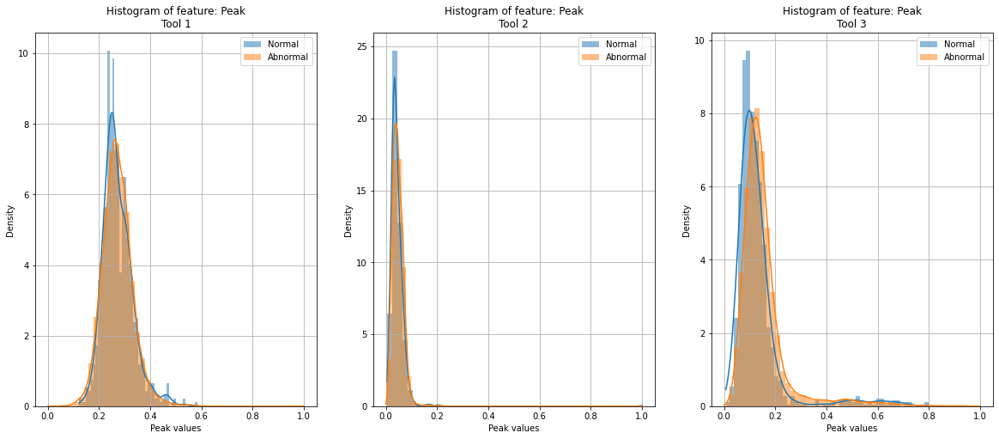

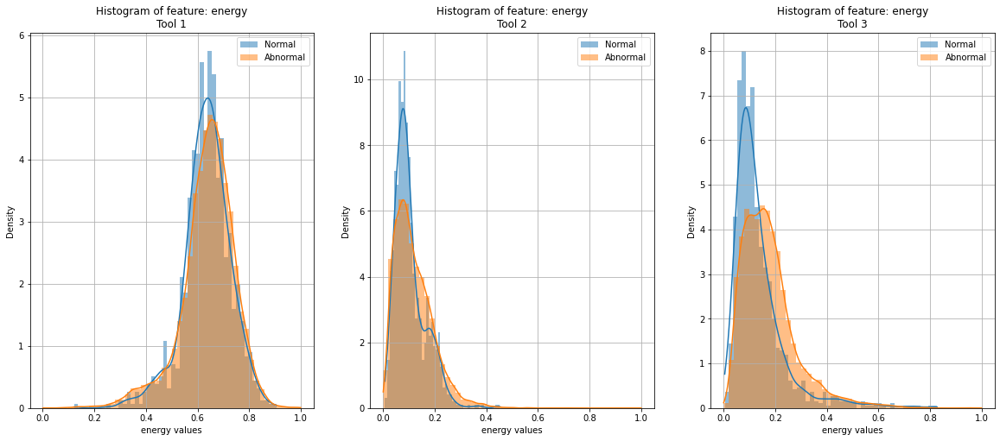

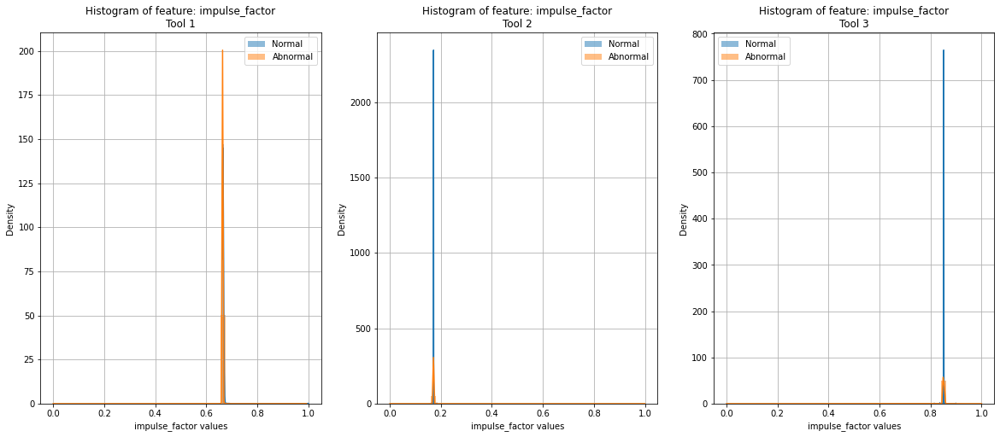

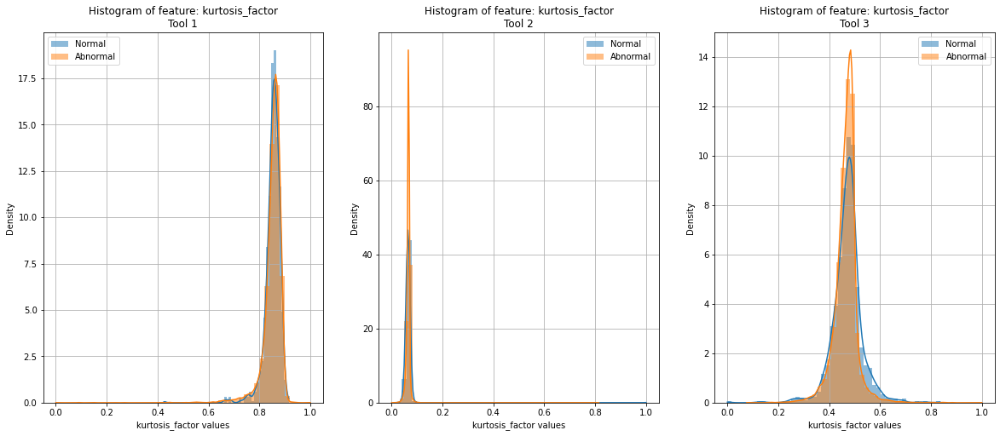

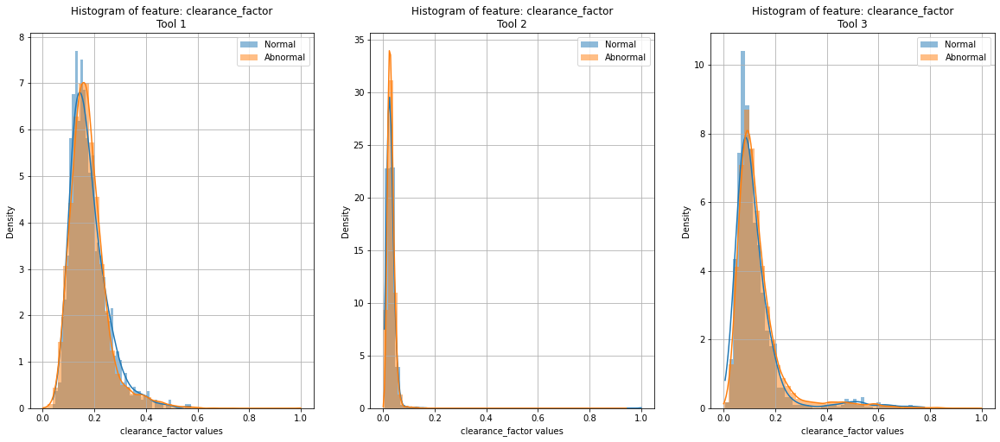

...

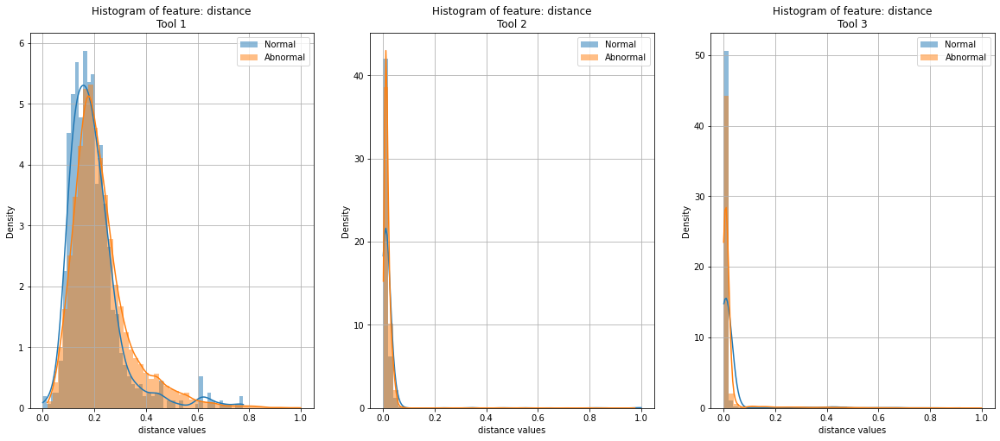

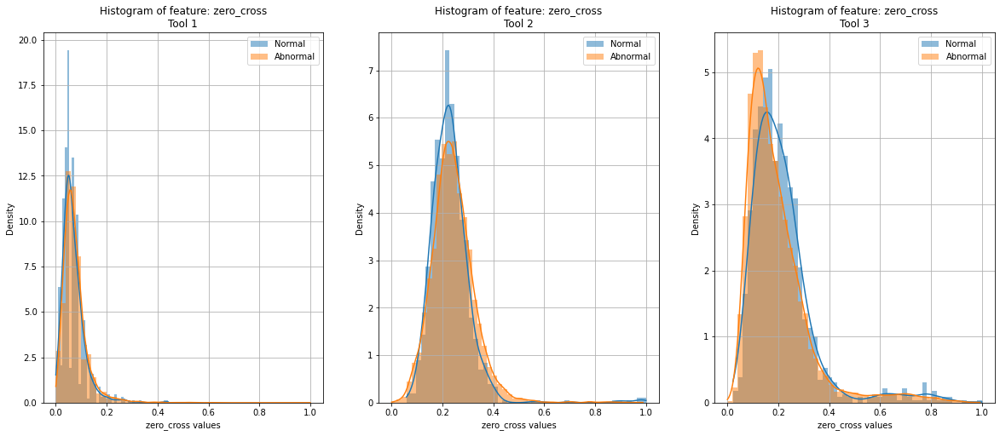

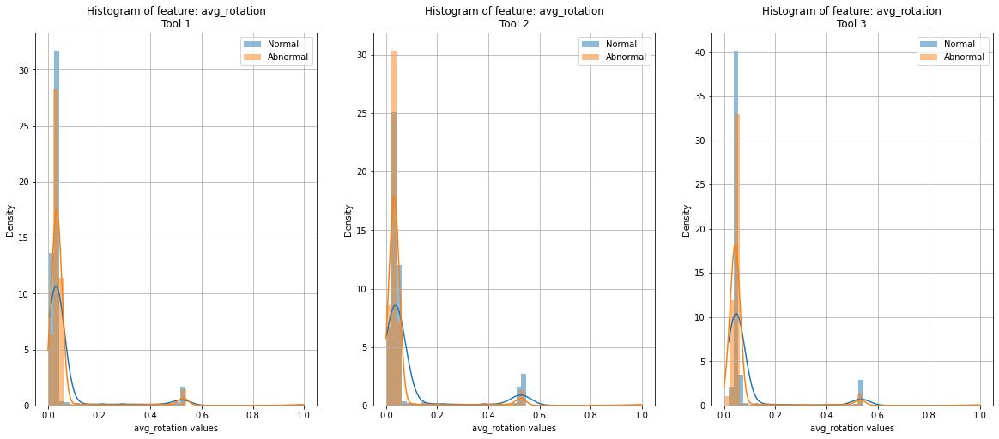

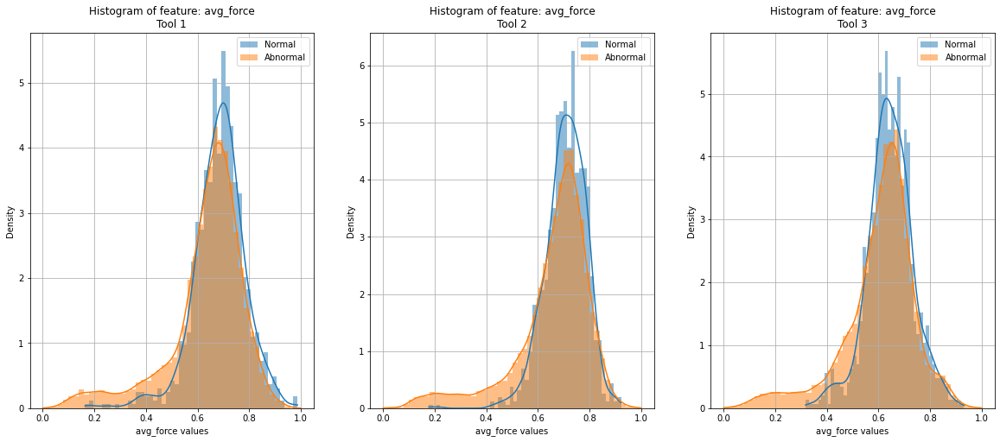

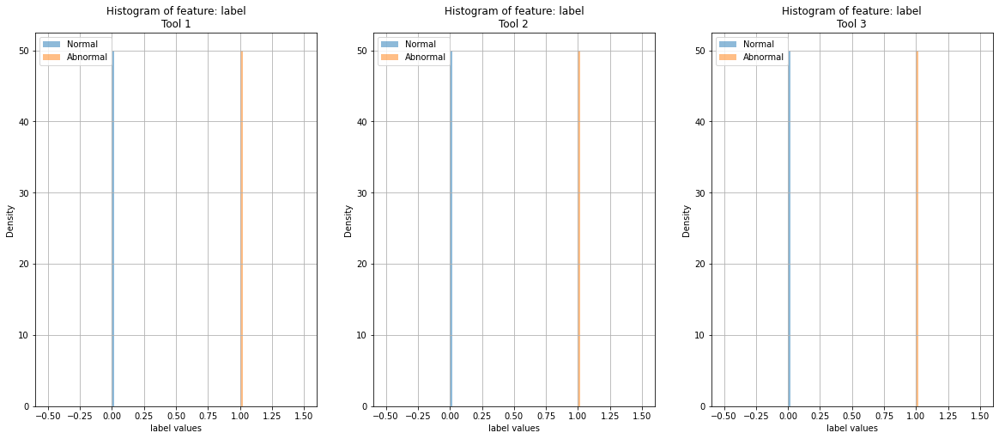

In [105]:
check_time_list=['energy','root_mean_square','variance','distance','zero_cross','avg_rotation','avg_force']
time_col_list=['Peak','energy','impulse_factor','kurtosis_factor','clearance_factor','square_root_mean','root_mean_square','kurtosis','margin_factor','crest_factor','skewness','peak_to_peak_value','shape_factor','mean','variance','distance','zero_cross','avg_rotation','avg_force','label']

for col,col_name in enumerate(time_col_list):
    
    # ax = plt.subplot(gs[col])   
    fig,ax=plt.subplots(1,3,figsize=(20,8)) 
    sns.histplot(combined_05_II[col_name][combined_05_II.label == 0], bins = 50, label = 'Normal',ax=ax[0],color='tab:blue', kde=True,stat='density',linewidth=0)
    sns.histplot(combined_05_II[col_name][combined_05_II.label == 1], bins = 50, label = 'Abnormal',ax=ax[0],color='tab:orange',kde=True,stat='density',linewidth=0)
    # ax[col].set_xlabel('Values')
    ax[0].set_title('Histogram of feature: ' + str(col_name)+'\nTool 1')
    ax[0].set_xlabel(col_name+' values')
    ax[0].grid(True)
    ax[0].legend()
    # ax[col].set_yticks(np.arange(0, 10, 1))

    sns.histplot(combined_06_II[col_name][combined_06_II.label == 0], bins = 50, label = 'Normal',ax=ax[1],color='tab:blue',kde=True,stat='density',linewidth=0)
    sns.histplot(combined_06_II[col_name][combined_06_II.label == 1], bins = 50, label = 'Abnormal',ax=ax[1],color='tab:orange',kde=True,stat='density',linewidth=0)
    # ax[col].set_xlabel('Values')
    ax[1].set_title('Histogram of feature: ' + str(col_name)+'\nTool 2')
    ax[1].set_xlabel(col_name+' values')
    ax[1].grid(True)
    ax[1].legend()

    sns.histplot(combined_11_II[col_name][combined_11_II.label == 0], bins = 50, label = 'Normal',ax=ax[2],color='tab:blue',kde=True,stat='density',linewidth=0)
    sns.histplot(combined_11_II[col_name][combined_11_II.label == 1], bins = 50, label = 'Abnormal',ax=ax[2],color='tab:orange',kde=True,stat='density',linewidth=0)
    # ax[col].set_xlabel('Values')
    ax[2].set_title('Histogram of feature: ' + str(col_name)+'\nTool 3')
    ax[2].set_xlabel(col_name+' values')
    ax[2].grid(True)
    ax[2].legend()

    # sns.distplot(combined_II[col_name][combined_II.label == 0], bins = 50, label = 'Normal',ax=ax[3],kde=True,stat='density',linewidth=0)
    # sns.distplot(combined_II[col_name][combined_II.label == 1], bins = 50, label = 'Abnormal',ax=ax[3],kde=True,stat='density',linewidth=0)
    # # ax[col].set_xlabel('Values')
    # ax[3].set_title('Histogram of feature: ' + str(col_name)+'\nTool: Combined')
    # ax[3].set_xlabel(col_name+' values')
    # plt.legend()
    plt.show()

# Section III histogram plot for cavity and not cavity

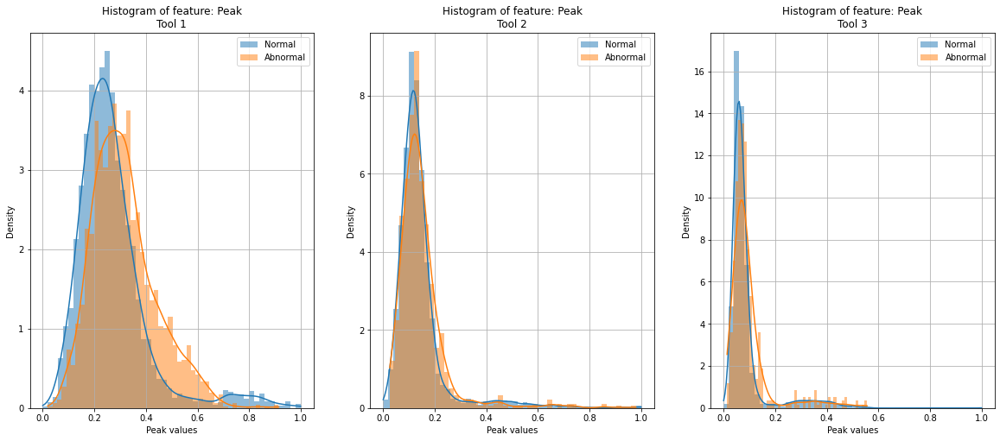

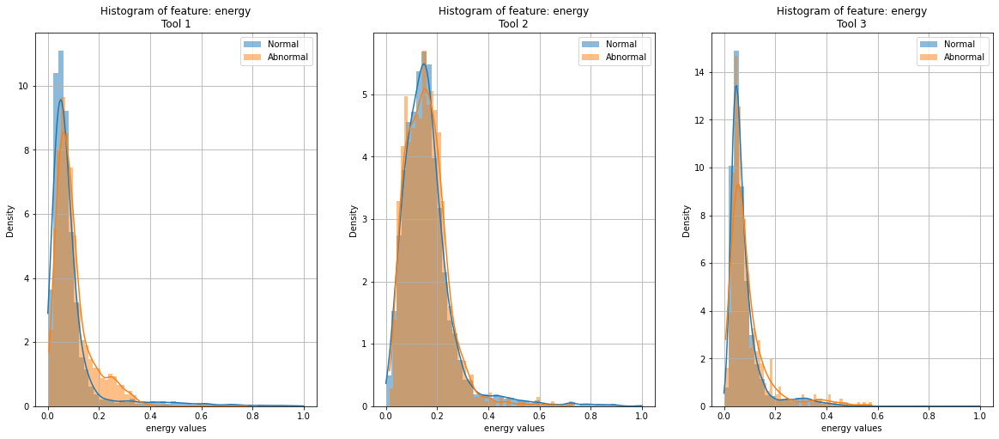

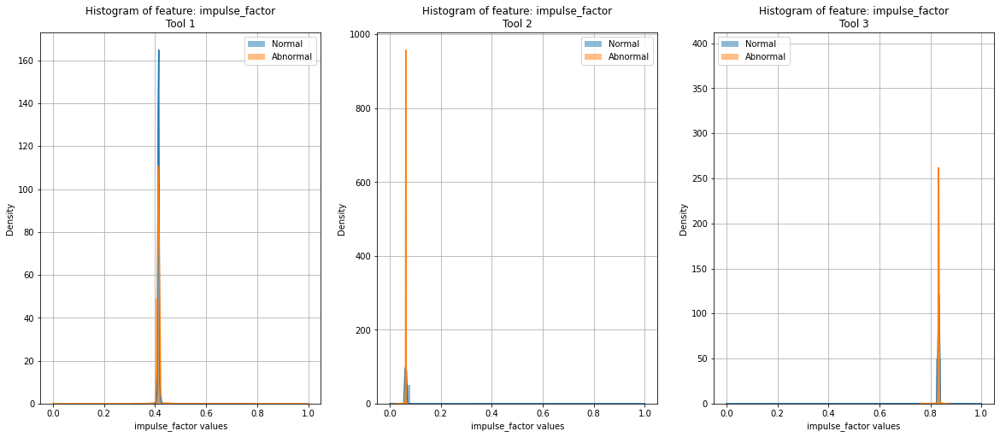

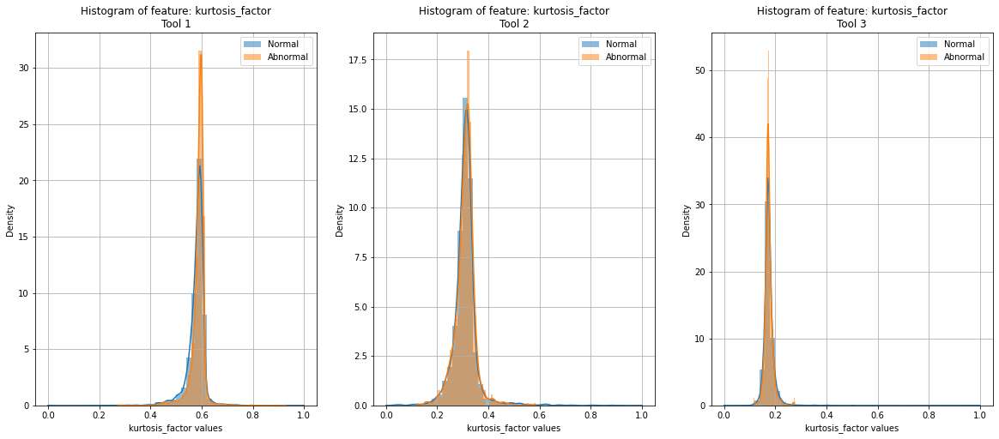

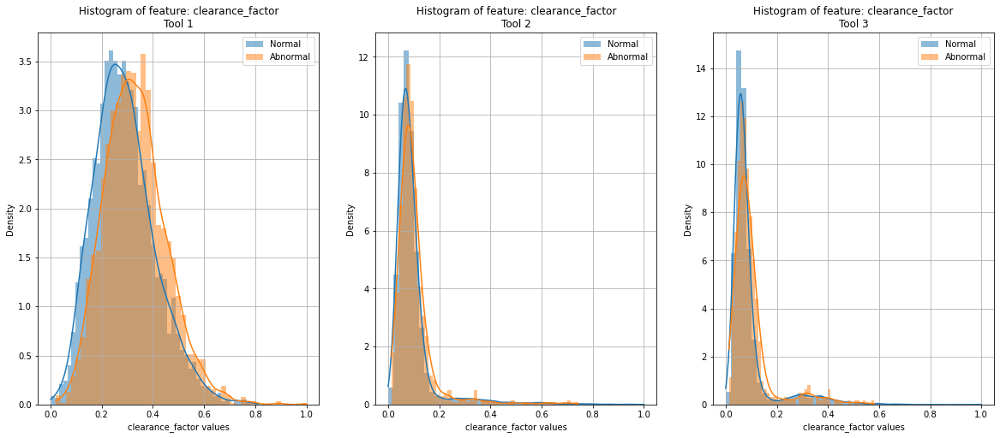

...

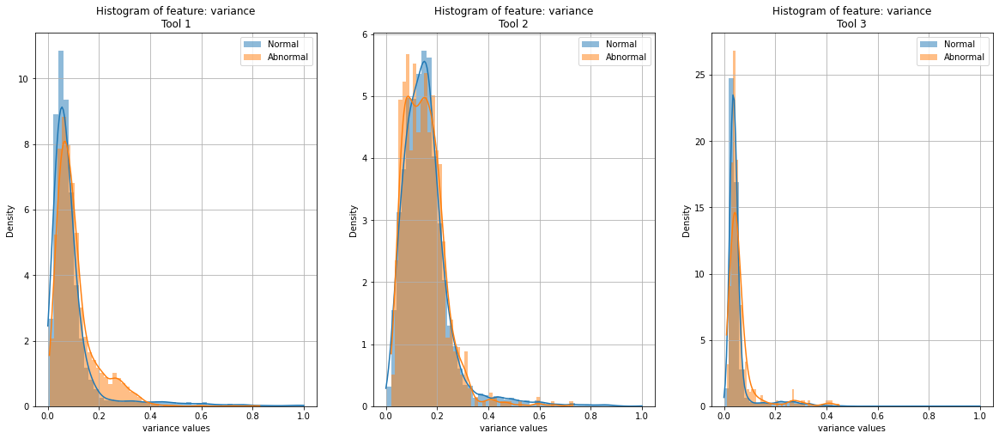

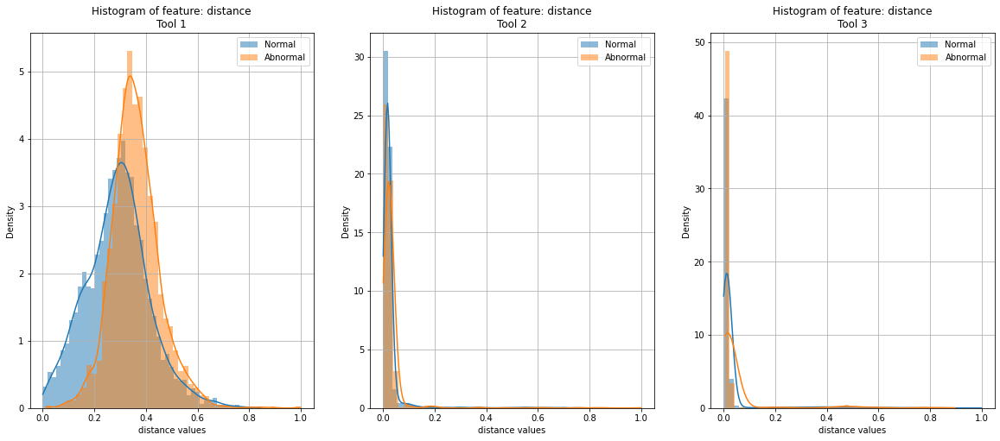

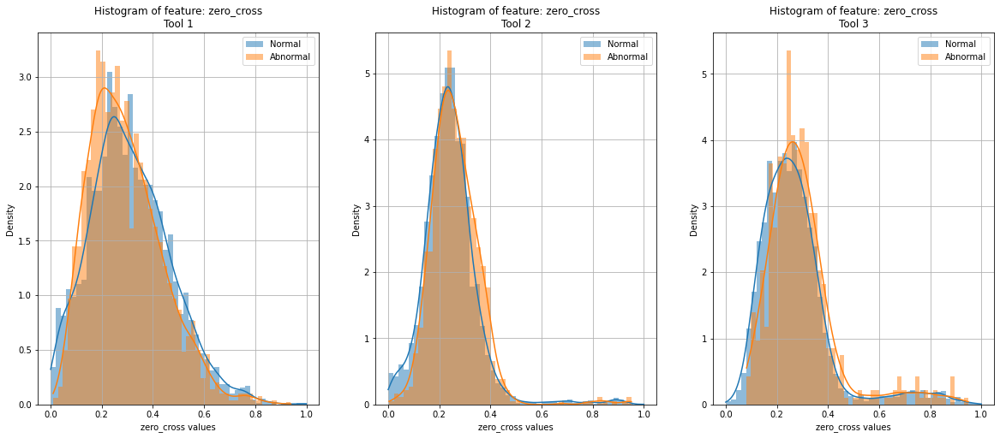

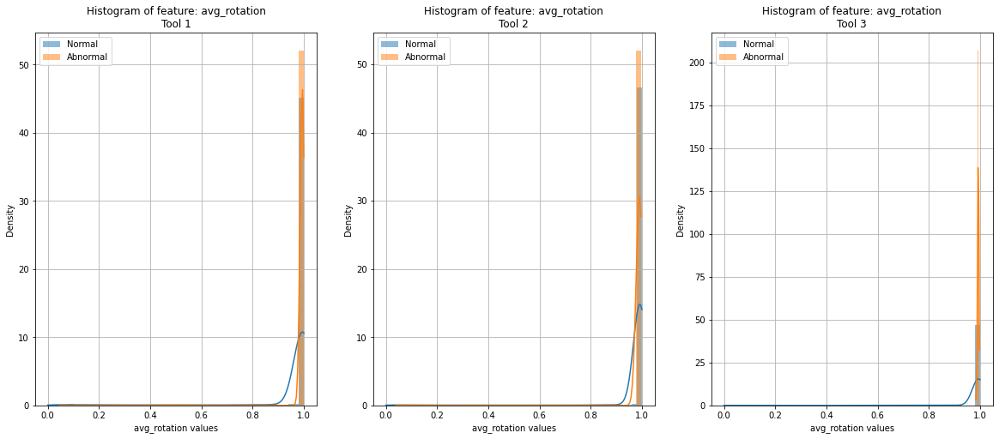

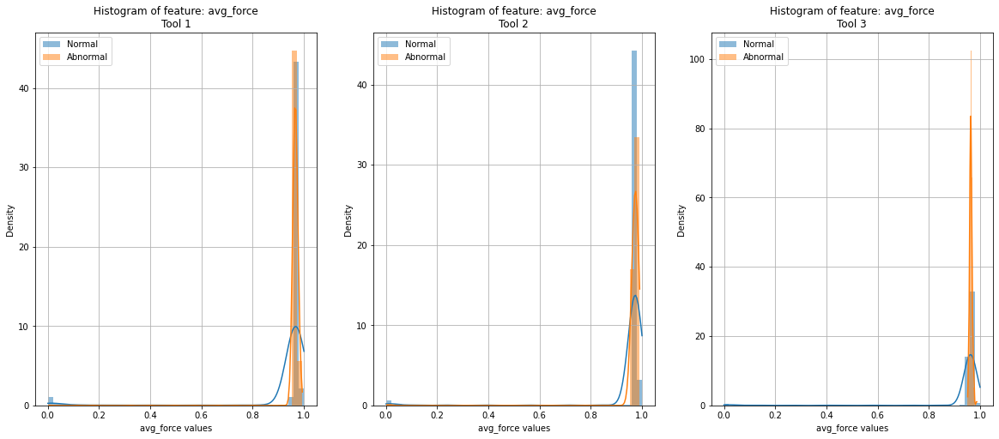

In [106]:
check_time_list=['energy','root_mean_square','variance','distance','zero_cross','avg_rotation','avg_force']
time_col_list=['Peak','energy','impulse_factor','kurtosis_factor','clearance_factor','square_root_mean','root_mean_square','kurtosis','margin_factor','crest_factor','skewness','peak_to_peak_value','shape_factor','mean','variance','distance','zero_cross','avg_rotation','avg_force','label']

for col,col_name in enumerate(time_col_list[:-1]):
    
    # ax = plt.subplot(gs[col])   
    fig,ax=plt.subplots(1,3,figsize=(20,8)) 
    sns.histplot(combined_05_III[col_name][combined_05_III.label == 0], bins = 50, label = 'Normal',ax=ax[0],color='tab:blue', kde=True,stat='density',linewidth=0)
    sns.histplot(combined_05_III[col_name][combined_05_III.label == 1], bins = 50, label = 'Abnormal',ax=ax[0],color='tab:orange', kde=True,stat='density',linewidth=0)
    # ax[col].set_xlabel('Values')
    ax[0].set_title('Histogram of feature: ' + str(col_name)+'\nTool 1')
    ax[0].set_xlabel(col_name+' values')
    ax[0].grid(True)
    ax[0].legend()
    # ax[col].set_yticks(np.arange(0, 10, 1))

    sns.histplot(combined_06_III[col_name][combined_06_III.label == 0], bins = 50, label = 'Normal',ax=ax[1],color='tab:blue', kde=True,stat='density',linewidth=0)
    sns.histplot(combined_06_III[col_name][combined_06_III.label == 1], bins = 50, label = 'Abnormal',ax=ax[1],color='tab:orange', kde=True,stat='density',linewidth=0)
    # ax[col].set_xlabel('Values')
    ax[1].set_title('Histogram of feature: ' + str(col_name)+'\nTool 2')
    ax[1].set_xlabel(col_name+' values')
    ax[1].grid(True)
    ax[1].legend()

    sns.histplot(combined_11_III[col_name][combined_11_III.label == 0], bins = 50, label = 'Normal',ax=ax[2],color='tab:blue', kde=True,stat='density',linewidth=0)
    sns.histplot(combined_11_III[col_name][combined_11_III.label == 1], bins = 50, label = 'Abnormal',ax=ax[2],color='tab:orange', kde=True,stat='density',linewidth=0)
    # ax[col].set_xlabel('Values')
    ax[2].set_title('Histogram of feature: ' + str(col_name)+'\nTool 3')
    ax[2].set_xlabel(col_name+' values')
    ax[2].grid(True)
    ax[2].legend()

    # sns.histplot(combined_III[col_name][combined_III.label == 0], bins = 50, label = 'Normal',ax=ax[3])
    # sns.histplot(combined_III[col_name][combined_III.label == 1], bins = 50, label = 'Abnormal',ax=ax[3])
    # # ax[col].set_xlabel('Values')
    # ax[3].set_title('Histogram of feature: ' + str(col_name)+'\nTool: Combined')
    # ax[3].set_xlabel(col_name+' values')
    # plt.legend()
    plt.show()

# Section IV histogram plot for cavity and not cavity

AttributeError: module 'seaborn' has no attribute 'hstplot'

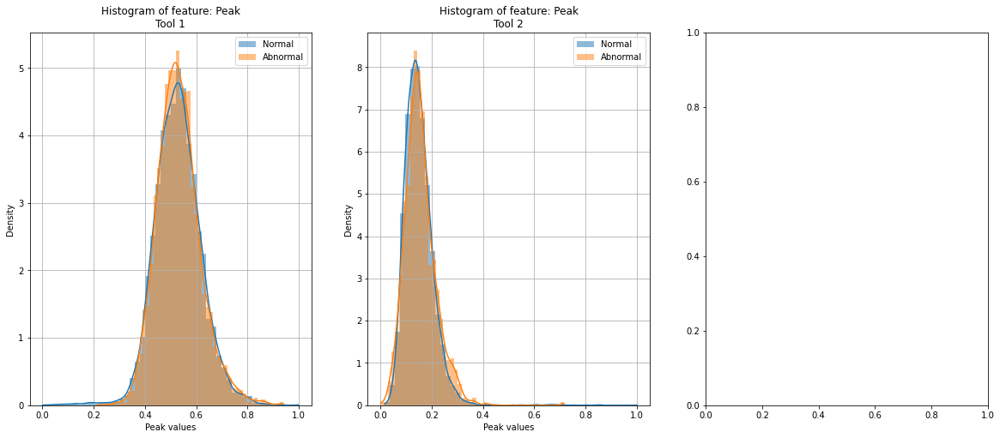

In [107]:
import matplotlib.gridspec as gridspec
check_time_list=['energy','root_mean_square','variance','distance','zero_cross','avg_rotation','avg_force']
time_col_list=['Peak','energy','impulse_factor','kurtosis_factor','clearance_factor','square_root_mean','root_mean_square','kurtosis','margin_factor','crest_factor','skewness','peak_to_peak_value','shape_factor','mean','variance','distance','zero_cross','avg_rotation','avg_force','label']

for col,col_name in enumerate(time_col_list[:-1]):
    
    # ax = plt.subplot(gs[col])   
    fig,ax=plt.subplots(1,3,figsize=(20,8)) 
    sns.histplot(combined_05_IV[col_name][combined_05_IV.label == 0], bins = 50, label = 'Normal',ax=ax[0],color='tab:blue', kde=True,stat='density',linewidth=0)
    sns.histplot(combined_05_IV[col_name][combined_05_IV.label == 1], bins = 50, label = 'Abnormal',ax=ax[0],color='tab:orange', kde=True,stat='density',linewidth=0)
    # ax[col].set_xlabel('Values')
    ax[0].set_title('Histogram of feature: ' + str(col_name)+'\nTool 1')
    ax[0].set_xlabel(col_name+' values')
    ax[0].grid(True)
    ax[0].legend()
    # ax[col].set_yticks(np.arange(0, 10, 1))

    sns.histplot(combined_06_IV[col_name][combined_06_IV.label == 0], bins = 50, label = 'Normal',ax=ax[1],color='tab:blue', kde=True,stat='density',linewidth=0)
    sns.histplot(combined_06_IV[col_name][combined_06_IV.label == 1], bins = 50, label = 'Abnormal',ax=ax[1],color='tab:orange', kde=True,stat='density',linewidth=0)
    # ax[col].set_xlabel('Values')
    ax[1].set_title('Histogram of feature: ' + str(col_name)+'\nTool 2')
    ax[1].set_xlabel(col_name+' values')
    ax[1].grid(True)
    ax[1].legend()

    sns.hstplot(combined_11_IV[col_name][combined_11_IV.label == 0], bins = 50, label = 'Normal',ax=ax[2],color='tab:blue', kde=True,stat='density',linewidth=0)
    sns.histplot(combined_11_IV[col_name][combined_11_IV.label == 1], bins = 50, label = 'Abnormal',ax=ax[2],color='tab:orange', kde=True,stat='density',linewidth=0)
    # ax[col].set_xlabel('Values')
    ax[2].set_title('Histogram of feature: ' + str(col_name)+'\nTool 3')
    ax[2].set_xlabel(col_name+' values')
    ax[2].grid(True)
    ax[2].legend()

    # sns.distplot(combined_IV[col_name][combined_IV.label == 0], bins = 50, label = 'Normal',ax=ax[3])
    # sns.distplot(combined_IV[col_name][combined_IV.label == 1], bins = 50, label = 'Abnormal',ax=ax[3])
    # # ax[col].set_xlabel('Values')
    # ax[3].set_title('Histogram of feature: ' + str(col_name)+'\nTool: Combined')
    # ax[3].set_xlabel(col_name+' values')
    # plt.legend()
    plt.show()